# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.996

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9968, 0.9948100429028273)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: p6ler8dx
Name: olive-field-128
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/p6ler8dx
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120418-p6ler8dx/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2573,3336,9334
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2573,2554,1681,3415,1648,3372
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4452,10791
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 632,773,2405
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 632,648,427,875,401,827
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1132,2678
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:13<2:13:45, 13.40s/it]

Epoch 1/600:   0%|▎                                                                                                                                                           | 1/600 [00:13<2:13:45, 13.40s/it, v_num=dx_1, total_loss_train=40.6, kl_local_train=29.9]

Epoch 2/600:   0%|▎                                                                                                                                                           | 1/600 [00:13<2:13:45, 13.40s/it, v_num=dx_1, total_loss_train=40.6, kl_local_train=29.9]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:06:43, 12.71s/it, v_num=dx_1, total_loss_train=40.6, kl_local_train=29.9]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:06:43, 12.71s/it, v_num=dx_1, total_loss_train=18.7, kl_local_train=42.2]

Epoch 3/600:   0%|▌                                                                                                                                                           | 2/600 [00:25<2:06:43, 12.71s/it, v_num=dx_1, total_loss_train=18.7, kl_local_train=42.2]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:37<2:03:54, 12.45s/it, v_num=dx_1, total_loss_train=18.7, kl_local_train=42.2]

Epoch 3/600:   0%|▊                                                                                                                                                             | 3/600 [00:37<2:03:54, 12.45s/it, v_num=dx_1, total_loss_train=15, kl_local_train=35.7]

Epoch 4/600:   0%|▊                                                                                                                                                             | 3/600 [00:37<2:03:54, 12.45s/it, v_num=dx_1, total_loss_train=15, kl_local_train=35.7]

Epoch 4/600:   1%|█                                                                                                                                                             | 4/600 [00:49<2:02:30, 12.33s/it, v_num=dx_1, total_loss_train=15, kl_local_train=35.7]

Epoch 4/600:   1%|█                                                                                                                                                             | 4/600 [00:49<2:02:30, 12.33s/it, v_num=dx_1, total_loss_train=14.1, kl_local_train=24]

Epoch 5/600:   1%|█                                                                                                                                                             | 4/600 [00:49<2:02:30, 12.33s/it, v_num=dx_1, total_loss_train=14.1, kl_local_train=24]

Epoch 5/600:   1%|█▎                                                                                                                                                            | 5/600 [01:02<2:01:57, 12.30s/it, v_num=dx_1, total_loss_train=14.1, kl_local_train=24]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:02<2:01:57, 12.30s/it, v_num=dx_1, total_loss_train=13.6, kl_local_train=14.6]

Epoch 6/600:   1%|█▎                                                                                                                                                          | 5/600 [01:03<2:01:57, 12.30s/it, v_num=dx_1, total_loss_train=13.6, kl_local_train=14.6]

Epoch 6/600:   1%|█▌                                                                                                                                                          | 6/600 [01:14<2:03:28, 12.47s/it, v_num=dx_1, total_loss_train=13.6, kl_local_train=14.6]

Epoch 6/600:   1%|▏                       | 6/600 [01:14<2:03:28, 12.47s/it, v_num=dx_1, total_loss_train=13.3, kl_local_train=11.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 7/600:   1%|▏                       | 6/600 [01:14<2:03:28, 12.47s/it, v_num=dx_1, total_loss_train=13.3, kl_local_train=11.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 7/600:   1%|▎                       | 7/600 [01:26<2:00:29, 12.19s/it, v_num=dx_1, total_loss_train=13.3, kl_local_train=11.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 7/600:   1%|▎                         | 7/600 [01:26<2:00:29, 12.19s/it, v_num=dx_1, total_loss_train=13, kl_local_train=11.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 8/600:   1%|▎                         | 7/600 [01:26<2:00:29, 12.19s/it, v_num=dx_1, total_loss_train=13, kl_local_train=11.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 8/600:   1%|▎                         | 8/600 [01:38<1:58:18, 11.99s/it, v_num=dx_1, total_loss_train=13, kl_local_train=11.8, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 8/600:   1%|▎                       | 8/600 [01:38<1:58:18, 11.99s/it, v_num=dx_1, total_loss_train=20.6, kl_local_train=11.3, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 9/600:   1%|▎                       | 8/600 [01:38<1:58:18, 11.99s/it, v_num=dx_1, total_loss_train=20.6, kl_local_train=11.3, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 9/600:   2%|▎                       | 9/600 [01:49<1:56:48, 11.86s/it, v_num=dx_1, total_loss_train=20.6, kl_local_train=11.3, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 9/600:   2%|▍                         | 9/600 [01:49<1:56:48, 11.86s/it, v_num=dx_1, total_loss_train=27.9, kl_local_train=21, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 10/600:   2%|▍                        | 9/600 [01:49<1:56:48, 11.86s/it, v_num=dx_1, total_loss_train=27.9, kl_local_train=21, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 10/600:   2%|▍                       | 10/600 [02:01<1:56:13, 11.82s/it, v_num=dx_1, total_loss_train=27.9, kl_local_train=21, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 10/600:   2%|▎                     | 10/600 [02:01<1:56:13, 11.82s/it, v_num=dx_1, total_loss_train=31.3, kl_local_train=67.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 11/600:   2%|▎                     | 10/600 [02:02<1:56:13, 11.82s/it, v_num=dx_1, total_loss_train=31.3, kl_local_train=67.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 11/600:   2%|▍                     | 11/600 [02:14<1:59:03, 12.13s/it, v_num=dx_1, total_loss_train=31.3, kl_local_train=67.7, metric_mi|status_control_train=0.0226, metric_mi|zone_train=0.00848, metric_mi|time_cat_train=0.0162, metric_mi|mouse_train=0.0377]

Epoch 11/600:   2%|▍                        | 11/600 [02:14<1:59:03, 12.13s/it, v_num=dx_1, total_loss_train=35.2, kl_local_train=80.5, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 12/600:   2%|▍                        | 11/600 [02:14<1:59:03, 12.13s/it, v_num=dx_1, total_loss_train=35.2, kl_local_train=80.5, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 12/600:   2%|▌                        | 12/600 [02:25<1:57:05, 11.95s/it, v_num=dx_1, total_loss_train=35.2, kl_local_train=80.5, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 12/600:   2%|▌                        | 12/600 [02:25<1:57:05, 11.95s/it, v_num=dx_1, total_loss_train=39.9, kl_local_train=85.3, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 13/600:   2%|▌                        | 12/600 [02:25<1:57:05, 11.95s/it, v_num=dx_1, total_loss_train=39.9, kl_local_train=85.3, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 13/600:   2%|▌                        | 13/600 [02:37<1:55:49, 11.84s/it, v_num=dx_1, total_loss_train=39.9, kl_local_train=85.3, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 13/600:   2%|▌                         | 13/600 [02:37<1:55:49, 11.84s/it, v_num=dx_1, total_loss_train=43.4, kl_local_train=100, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 14/600:   2%|▌                         | 13/600 [02:37<1:55:49, 11.84s/it, v_num=dx_1, total_loss_train=43.4, kl_local_train=100, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 14/600:   2%|▌                         | 14/600 [02:48<1:54:52, 11.76s/it, v_num=dx_1, total_loss_train=43.4, kl_local_train=100, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 14/600:   2%|▋                           | 14/600 [02:48<1:54:52, 11.76s/it, v_num=dx_1, total_loss_train=47, kl_local_train=122, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 15/600:   2%|▋                           | 14/600 [02:49<1:54:52, 11.76s/it, v_num=dx_1, total_loss_train=47, kl_local_train=122, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 15/600:   2%|▋                           | 15/600 [03:00<1:54:30, 11.74s/it, v_num=dx_1, total_loss_train=47, kl_local_train=122, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 15/600:   2%|▋                         | 15/600 [03:00<1:54:30, 11.74s/it, v_num=dx_1, total_loss_train=50.9, kl_local_train=132, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 16/600:   2%|▋                         | 15/600 [03:01<1:54:30, 11.74s/it, v_num=dx_1, total_loss_train=50.9, kl_local_train=132, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 16/600:   3%|▋                         | 16/600 [03:13<1:57:30, 12.07s/it, v_num=dx_1, total_loss_train=50.9, kl_local_train=132, metric_mi|status_control_train=0.121, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.0482, metric_mi|mouse_train=0.0582]

Epoch 16/600:   3%|▋                           | 16/600 [03:13<1:57:30, 12.07s/it, v_num=dx_1, total_loss_train=54.9, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 17/600:   3%|▋                           | 16/600 [03:13<1:57:30, 12.07s/it, v_num=dx_1, total_loss_train=54.9, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 17/600:   3%|▊                           | 17/600 [03:25<1:55:55, 11.93s/it, v_num=dx_1, total_loss_train=54.9, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 17/600:   3%|▊                             | 17/600 [03:25<1:55:55, 11.93s/it, v_num=dx_1, total_loss_train=59, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 18/600:   3%|▊                             | 17/600 [03:25<1:55:55, 11.93s/it, v_num=dx_1, total_loss_train=59, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 18/600:   3%|▉                             | 18/600 [03:36<1:54:37, 11.82s/it, v_num=dx_1, total_loss_train=59, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 18/600:   3%|▊                           | 18/600 [03:36<1:54:37, 11.82s/it, v_num=dx_1, total_loss_train=63.3, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 19/600:   3%|▊                           | 18/600 [03:36<1:54:37, 11.82s/it, v_num=dx_1, total_loss_train=63.3, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 19/600:   3%|▉                           | 19/600 [03:48<1:53:45, 11.75s/it, v_num=dx_1, total_loss_train=63.3, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 19/600:   3%|▉                           | 19/600 [03:48<1:53:45, 11.75s/it, v_num=dx_1, total_loss_train=67.5, kl_local_train=136, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 20/600:   3%|▉                           | 19/600 [03:48<1:53:45, 11.75s/it, v_num=dx_1, total_loss_train=67.5, kl_local_train=136, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 20/600:   3%|▉                           | 20/600 [04:00<1:53:47, 11.77s/it, v_num=dx_1, total_loss_train=67.5, kl_local_train=136, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 20/600:   3%|▉                           | 20/600 [04:00<1:53:47, 11.77s/it, v_num=dx_1, total_loss_train=71.7, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 21/600:   3%|▉                           | 20/600 [04:01<1:53:47, 11.77s/it, v_num=dx_1, total_loss_train=71.7, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 21/600:   4%|▉                           | 21/600 [04:12<1:56:50, 12.11s/it, v_num=dx_1, total_loss_train=71.7, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 21/600:   4%|█                            | 21/600 [04:12<1:56:50, 12.11s/it, v_num=dx_1, total_loss_train=75.9, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 22/600:   4%|█                            | 21/600 [04:13<1:56:50, 12.11s/it, v_num=dx_1, total_loss_train=75.9, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 22/600:   4%|█                            | 22/600 [04:24<1:55:18, 11.97s/it, v_num=dx_1, total_loss_train=75.9, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 22/600:   4%|█                            | 22/600 [04:24<1:55:18, 11.97s/it, v_num=dx_1, total_loss_train=80.2, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 23/600:   4%|█                            | 22/600 [04:24<1:55:18, 11.97s/it, v_num=dx_1, total_loss_train=80.2, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 23/600:   4%|█                            | 23/600 [04:36<1:54:11, 11.87s/it, v_num=dx_1, total_loss_train=80.2, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 23/600:   4%|█                            | 23/600 [04:36<1:54:11, 11.87s/it, v_num=dx_1, total_loss_train=84.3, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 24/600:   4%|█                            | 23/600 [04:36<1:54:11, 11.87s/it, v_num=dx_1, total_loss_train=84.3, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 24/600:   4%|█▏                           | 24/600 [04:47<1:53:14, 11.80s/it, v_num=dx_1, total_loss_train=84.3, kl_local_train=138, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 24/600:   4%|█▏                           | 24/600 [04:47<1:53:14, 11.80s/it, v_num=dx_1, total_loss_train=88.7, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 25/600:   4%|█▏                           | 24/600 [04:47<1:53:14, 11.80s/it, v_num=dx_1, total_loss_train=88.7, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 25/600:   4%|█▏                           | 25/600 [04:59<1:53:10, 11.81s/it, v_num=dx_1, total_loss_train=88.7, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 25/600:   4%|█▏                           | 25/600 [04:59<1:53:10, 11.81s/it, v_num=dx_1, total_loss_train=92.8, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 26/600:   4%|█▏                           | 25/600 [05:01<1:53:10, 11.81s/it, v_num=dx_1, total_loss_train=92.8, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 26/600:   4%|█▎                           | 26/600 [05:12<1:56:12, 12.15s/it, v_num=dx_1, total_loss_train=92.8, kl_local_train=137, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 26/600:   4%|█▎                            | 26/600 [05:12<1:56:12, 12.15s/it, v_num=dx_1, total_loss_train=97.2, kl_local_train=138, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|█▎                            | 26/600 [05:12<1:56:12, 12.15s/it, v_num=dx_1, total_loss_train=97.2, kl_local_train=138, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|█▎                            | 27/600 [05:24<1:54:33, 11.99s/it, v_num=dx_1, total_loss_train=97.2, kl_local_train=138, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|█▍                             | 27/600 [05:24<1:54:33, 11.99s/it, v_num=dx_1, total_loss_train=101, kl_local_train=139, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   4%|█▍                             | 27/600 [05:24<1:54:33, 11.99s/it, v_num=dx_1, total_loss_train=101, kl_local_train=139, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   5%|█▍                             | 28/600 [05:35<1:53:20, 11.89s/it, v_num=dx_1, total_loss_train=101, kl_local_train=139, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   5%|█▍                             | 28/600 [05:35<1:53:20, 11.89s/it, v_num=dx_1, total_loss_train=106, kl_local_train=138, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|█▍                             | 28/600 [05:35<1:53:20, 11.89s/it, v_num=dx_1, total_loss_train=106, kl_local_train=138, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|█▍                             | 29/600 [05:47<1:52:23, 11.81s/it, v_num=dx_1, total_loss_train=106, kl_local_train=138, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|█▍                             | 29/600 [05:47<1:52:23, 11.81s/it, v_num=dx_1, total_loss_train=110, kl_local_train=140, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|█▍                             | 29/600 [05:47<1:52:23, 11.81s/it, v_num=dx_1, total_loss_train=110, kl_local_train=140, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|█▌                             | 30/600 [05:59<1:53:02, 11.90s/it, v_num=dx_1, total_loss_train=110, kl_local_train=140, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|█▌                             | 30/600 [05:59<1:53:02, 11.90s/it, v_num=dx_1, total_loss_train=114, kl_local_train=141, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|█▌                             | 30/600 [06:00<1:53:02, 11.90s/it, v_num=dx_1, total_loss_train=114, kl_local_train=141, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|█▌                             | 31/600 [06:12<1:55:42, 12.20s/it, v_num=dx_1, total_loss_train=114, kl_local_train=141, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|█▌                            | 31/600 [06:12<1:55:42, 12.20s/it, v_num=dx_1, total_loss_train=119, kl_local_train=141, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 32/600:   5%|█▌                            | 31/600 [06:12<1:55:42, 12.20s/it, v_num=dx_1, total_loss_train=119, kl_local_train=141, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 32/600:   5%|█▌                            | 32/600 [06:24<1:53:58, 12.04s/it, v_num=dx_1, total_loss_train=119, kl_local_train=141, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 32/600:   5%|█▌                            | 32/600 [06:24<1:53:58, 12.04s/it, v_num=dx_1, total_loss_train=123, kl_local_train=141, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 33/600:   5%|█▌                            | 32/600 [06:24<1:53:58, 12.04s/it, v_num=dx_1, total_loss_train=123, kl_local_train=141, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 33/600:   6%|█▋                            | 33/600 [06:35<1:52:42, 11.93s/it, v_num=dx_1, total_loss_train=123, kl_local_train=141, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 33/600:   6%|█▋                            | 33/600 [06:35<1:52:42, 11.93s/it, v_num=dx_1, total_loss_train=127, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 34/600:   6%|█▋                            | 33/600 [06:35<1:52:42, 11.93s/it, v_num=dx_1, total_loss_train=127, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 34/600:   6%|█▋                            | 34/600 [06:47<1:51:40, 11.84s/it, v_num=dx_1, total_loss_train=127, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 34/600:   6%|█▋                            | 34/600 [06:47<1:51:40, 11.84s/it, v_num=dx_1, total_loss_train=131, kl_local_train=146, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 35/600:   6%|█▋                            | 34/600 [06:47<1:51:40, 11.84s/it, v_num=dx_1, total_loss_train=131, kl_local_train=146, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 35/600:   6%|█▊                            | 35/600 [06:59<1:51:38, 11.86s/it, v_num=dx_1, total_loss_train=131, kl_local_train=146, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 35/600:   6%|█▊                            | 35/600 [06:59<1:51:38, 11.86s/it, v_num=dx_1, total_loss_train=136, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 36/600:   6%|█▊                            | 35/600 [07:00<1:51:38, 11.86s/it, v_num=dx_1, total_loss_train=136, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 36/600:   6%|█▊                            | 36/600 [07:12<1:54:24, 12.17s/it, v_num=dx_1, total_loss_train=136, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 36/600:   6%|█▊                            | 36/600 [07:12<1:54:24, 12.17s/it, v_num=dx_1, total_loss_train=140, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 37/600:   6%|█▊                            | 36/600 [07:12<1:54:24, 12.17s/it, v_num=dx_1, total_loss_train=140, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 37/600:   6%|█▊                            | 37/600 [07:24<1:52:46, 12.02s/it, v_num=dx_1, total_loss_train=140, kl_local_train=145, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 37/600:   6%|█▊                            | 37/600 [07:24<1:52:46, 12.02s/it, v_num=dx_1, total_loss_train=144, kl_local_train=144, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 38/600:   6%|█▊                            | 37/600 [07:24<1:52:46, 12.02s/it, v_num=dx_1, total_loss_train=144, kl_local_train=144, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 38/600:   6%|█▉                            | 38/600 [07:35<1:51:31, 11.91s/it, v_num=dx_1, total_loss_train=144, kl_local_train=144, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 38/600:   6%|█▉                            | 38/600 [07:35<1:51:31, 11.91s/it, v_num=dx_1, total_loss_train=148, kl_local_train=146, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 39/600:   6%|█▉                            | 38/600 [07:35<1:51:31, 11.91s/it, v_num=dx_1, total_loss_train=148, kl_local_train=146, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 39/600:   6%|█▉                            | 39/600 [07:47<1:50:32, 11.82s/it, v_num=dx_1, total_loss_train=148, kl_local_train=146, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 39/600:   6%|█▉                            | 39/600 [07:47<1:50:32, 11.82s/it, v_num=dx_1, total_loss_train=153, kl_local_train=147, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 40/600:   6%|█▉                            | 39/600 [07:47<1:50:32, 11.82s/it, v_num=dx_1, total_loss_train=153, kl_local_train=147, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 40/600:   7%|██                            | 40/600 [07:59<1:51:10, 11.91s/it, v_num=dx_1, total_loss_train=153, kl_local_train=147, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 40/600:   7%|██                            | 40/600 [07:59<1:51:10, 11.91s/it, v_num=dx_1, total_loss_train=157, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 41/600:   7%|██                            | 40/600 [08:00<1:51:10, 11.91s/it, v_num=dx_1, total_loss_train=157, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 41/600:   7%|██                            | 41/600 [08:12<1:53:49, 12.22s/it, v_num=dx_1, total_loss_train=157, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 41/600:   7%|██                             | 41/600 [08:12<1:53:49, 12.22s/it, v_num=dx_1, total_loss_train=161, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 42/600:   7%|██                             | 41/600 [08:12<1:53:49, 12.22s/it, v_num=dx_1, total_loss_train=161, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 42/600:   7%|██▏                            | 42/600 [08:24<1:52:08, 12.06s/it, v_num=dx_1, total_loss_train=161, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 42/600:   7%|██▏                            | 42/600 [08:24<1:52:08, 12.06s/it, v_num=dx_1, total_loss_train=165, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 43/600:   7%|██▏                            | 42/600 [08:24<1:52:08, 12.06s/it, v_num=dx_1, total_loss_train=165, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 43/600:   7%|██▏                            | 43/600 [08:35<1:50:47, 11.93s/it, v_num=dx_1, total_loss_train=165, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 43/600:   7%|██▏                            | 43/600 [08:35<1:50:47, 11.93s/it, v_num=dx_1, total_loss_train=170, kl_local_train=154, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 44/600:   7%|██▏                            | 43/600 [08:35<1:50:47, 11.93s/it, v_num=dx_1, total_loss_train=170, kl_local_train=154, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 44/600:   7%|██▎                            | 44/600 [08:47<1:49:49, 11.85s/it, v_num=dx_1, total_loss_train=170, kl_local_train=154, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 44/600:   7%|██▎                            | 44/600 [08:47<1:49:49, 11.85s/it, v_num=dx_1, total_loss_train=174, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 45/600:   7%|██▎                            | 44/600 [08:47<1:49:49, 11.85s/it, v_num=dx_1, total_loss_train=174, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 45/600:   8%|██▎                            | 45/600 [08:59<1:49:37, 11.85s/it, v_num=dx_1, total_loss_train=174, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 45/600:   8%|██▎                            | 45/600 [08:59<1:49:37, 11.85s/it, v_num=dx_1, total_loss_train=178, kl_local_train=153, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 46/600:   8%|██▎                            | 45/600 [09:00<1:49:37, 11.85s/it, v_num=dx_1, total_loss_train=178, kl_local_train=153, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 46/600:   8%|██▍                            | 46/600 [09:12<1:52:34, 12.19s/it, v_num=dx_1, total_loss_train=178, kl_local_train=153, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 46/600:   8%|██▍                            | 46/600 [09:12<1:52:34, 12.19s/it, v_num=dx_1, total_loss_train=182, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 47/600:   8%|██▍                            | 46/600 [09:12<1:52:34, 12.19s/it, v_num=dx_1, total_loss_train=182, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 47/600:   8%|██▍                            | 47/600 [09:23<1:51:11, 12.06s/it, v_num=dx_1, total_loss_train=182, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 47/600:   8%|██▍                            | 47/600 [09:23<1:51:11, 12.06s/it, v_num=dx_1, total_loss_train=187, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 48/600:   8%|██▍                            | 47/600 [09:23<1:51:11, 12.06s/it, v_num=dx_1, total_loss_train=187, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 48/600:   8%|██▍                            | 48/600 [09:35<1:50:04, 11.96s/it, v_num=dx_1, total_loss_train=187, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 48/600:   8%|██▍                            | 48/600 [09:35<1:50:04, 11.96s/it, v_num=dx_1, total_loss_train=191, kl_local_train=151, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 49/600:   8%|██▍                            | 48/600 [09:35<1:50:04, 11.96s/it, v_num=dx_1, total_loss_train=191, kl_local_train=151, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 49/600:   8%|██▌                            | 49/600 [09:47<1:49:27, 11.92s/it, v_num=dx_1, total_loss_train=191, kl_local_train=151, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 49/600:   8%|██▌                            | 49/600 [09:47<1:49:27, 11.92s/it, v_num=dx_1, total_loss_train=195, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 50/600:   8%|██▌                            | 49/600 [09:47<1:49:27, 11.92s/it, v_num=dx_1, total_loss_train=195, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 50/600:   8%|██▌                            | 50/600 [09:59<1:50:08, 12.01s/it, v_num=dx_1, total_loss_train=195, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 50/600:   8%|██▌                            | 50/600 [09:59<1:50:08, 12.01s/it, v_num=dx_1, total_loss_train=199, kl_local_train=153, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 51/600:   8%|██▌                            | 50/600 [10:00<1:50:08, 12.01s/it, v_num=dx_1, total_loss_train=199, kl_local_train=153, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 51/600:   8%|██▋                            | 51/600 [10:12<1:52:58, 12.35s/it, v_num=dx_1, total_loss_train=199, kl_local_train=153, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 51/600:   8%|██▌                           | 51/600 [10:12<1:52:58, 12.35s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   8%|██▌                           | 51/600 [10:12<1:52:58, 12.35s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   9%|██▌                           | 52/600 [10:24<1:51:10, 12.17s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   9%|██▌                           | 52/600 [10:24<1:51:10, 12.17s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▌                           | 52/600 [10:24<1:51:10, 12.17s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▋                           | 53/600 [10:36<1:49:42, 12.03s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▋                           | 53/600 [10:36<1:49:42, 12.03s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▋                           | 53/600 [10:36<1:49:42, 12.03s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▋                           | 54/600 [10:48<1:48:45, 11.95s/it, v_num=dx_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▋                           | 54/600 [10:48<1:48:45, 11.95s/it, v_num=dx_1, total_loss_train=200, kl_local_train=148, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▋                           | 54/600 [10:48<1:48:45, 11.95s/it, v_num=dx_1, total_loss_train=200, kl_local_train=148, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▊                           | 55/600 [10:59<1:48:17, 11.92s/it, v_num=dx_1, total_loss_train=200, kl_local_train=148, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▊                           | 55/600 [10:59<1:48:17, 11.92s/it, v_num=dx_1, total_loss_train=200, kl_local_train=149, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▊                           | 55/600 [11:01<1:48:17, 11.92s/it, v_num=dx_1, total_loss_train=200, kl_local_train=149, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▊                           | 56/600 [11:12<1:51:02, 12.25s/it, v_num=dx_1, total_loss_train=200, kl_local_train=149, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▊                           | 56/600 [11:12<1:51:02, 12.25s/it, v_num=dx_1, total_loss_train=200, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:   9%|██▊                           | 56/600 [11:12<1:51:02, 12.25s/it, v_num=dx_1, total_loss_train=200, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                           | 57/600 [11:24<1:49:28, 12.10s/it, v_num=dx_1, total_loss_train=200, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                           | 57/600 [11:24<1:49:28, 12.10s/it, v_num=dx_1, total_loss_train=200, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                           | 57/600 [11:24<1:49:28, 12.10s/it, v_num=dx_1, total_loss_train=200, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▉                           | 58/600 [11:36<1:48:17, 11.99s/it, v_num=dx_1, total_loss_train=200, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▉                           | 58/600 [11:36<1:48:17, 11.99s/it, v_num=dx_1, total_loss_train=200, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 58/600 [11:36<1:48:17, 11.99s/it, v_num=dx_1, total_loss_train=200, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 59/600 [11:48<1:47:28, 11.92s/it, v_num=dx_1, total_loss_train=200, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 59/600 [11:48<1:47:28, 11.92s/it, v_num=dx_1, total_loss_train=201, kl_local_train=143, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                           | 59/600 [11:48<1:47:28, 11.92s/it, v_num=dx_1, total_loss_train=201, kl_local_train=143, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|███                           | 60/600 [12:00<1:47:04, 11.90s/it, v_num=dx_1, total_loss_train=201, kl_local_train=143, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|███                           | 60/600 [12:00<1:47:04, 11.90s/it, v_num=dx_1, total_loss_train=200, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███                           | 60/600 [12:01<1:47:04, 11.90s/it, v_num=dx_1, total_loss_train=200, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███                           | 61/600 [12:13<1:49:57, 12.24s/it, v_num=dx_1, total_loss_train=200, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███▏                           | 61/600 [12:13<1:49:57, 12.24s/it, v_num=dx_1, total_loss_train=201, kl_local_train=142, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 62/600:  10%|███▏                           | 61/600 [12:13<1:49:57, 12.24s/it, v_num=dx_1, total_loss_train=201, kl_local_train=142, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 62/600:  10%|███▏                           | 62/600 [12:24<1:48:34, 12.11s/it, v_num=dx_1, total_loss_train=201, kl_local_train=142, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 62/600:  10%|███▏                           | 62/600 [12:24<1:48:34, 12.11s/it, v_num=dx_1, total_loss_train=201, kl_local_train=142, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 63/600:  10%|███▏                           | 62/600 [12:24<1:48:34, 12.11s/it, v_num=dx_1, total_loss_train=201, kl_local_train=142, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 63/600:  10%|███▎                           | 63/600 [12:36<1:47:29, 12.01s/it, v_num=dx_1, total_loss_train=201, kl_local_train=142, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 63/600:  10%|███▎                           | 63/600 [12:36<1:47:29, 12.01s/it, v_num=dx_1, total_loss_train=201, kl_local_train=139, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 64/600:  10%|███▎                           | 63/600 [12:36<1:47:29, 12.01s/it, v_num=dx_1, total_loss_train=201, kl_local_train=139, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 64/600:  11%|███▎                           | 64/600 [12:48<1:46:38, 11.94s/it, v_num=dx_1, total_loss_train=201, kl_local_train=139, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 64/600:  11%|███▎                           | 64/600 [12:48<1:46:38, 11.94s/it, v_num=dx_1, total_loss_train=201, kl_local_train=138, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 65/600:  11%|███▎                           | 64/600 [12:48<1:46:38, 11.94s/it, v_num=dx_1, total_loss_train=201, kl_local_train=138, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 65/600:  11%|███▎                           | 65/600 [13:00<1:46:20, 11.93s/it, v_num=dx_1, total_loss_train=201, kl_local_train=138, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 65/600:  11%|███▎                           | 65/600 [13:00<1:46:20, 11.93s/it, v_num=dx_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 66/600:  11%|███▎                           | 65/600 [13:01<1:46:20, 11.93s/it, v_num=dx_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 66/600:  11%|███▍                           | 66/600 [13:13<1:49:29, 12.30s/it, v_num=dx_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 66/600:  11%|███▎                          | 66/600 [13:13<1:49:29, 12.30s/it, v_num=dx_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 67/600:  11%|███▎                          | 66/600 [13:13<1:49:29, 12.30s/it, v_num=dx_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 67/600:  11%|███▎                          | 67/600 [13:25<1:48:16, 12.19s/it, v_num=dx_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 67/600:  11%|███▎                          | 67/600 [13:25<1:48:16, 12.19s/it, v_num=dx_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 68/600:  11%|███▎                          | 67/600 [13:25<1:48:16, 12.19s/it, v_num=dx_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 68/600:  11%|███▍                          | 68/600 [13:37<1:47:23, 12.11s/it, v_num=dx_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 68/600:  11%|███▍                          | 68/600 [13:37<1:47:23, 12.11s/it, v_num=dx_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 69/600:  11%|███▍                          | 68/600 [13:37<1:47:23, 12.11s/it, v_num=dx_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 69/600:  12%|███▍                          | 69/600 [13:49<1:46:55, 12.08s/it, v_num=dx_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 69/600:  12%|███▍                          | 69/600 [13:49<1:46:55, 12.08s/it, v_num=dx_1, total_loss_train=202, kl_local_train=134, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 70/600:  12%|███▍                          | 69/600 [13:49<1:46:55, 12.08s/it, v_num=dx_1, total_loss_train=202, kl_local_train=134, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 70/600:  12%|███▌                          | 70/600 [14:01<1:47:05, 12.12s/it, v_num=dx_1, total_loss_train=202, kl_local_train=134, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 70/600:  12%|███▌                          | 70/600 [14:01<1:47:05, 12.12s/it, v_num=dx_1, total_loss_train=202, kl_local_train=131, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 71/600:  12%|███▌                          | 70/600 [14:02<1:47:05, 12.12s/it, v_num=dx_1, total_loss_train=202, kl_local_train=131, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 71/600:  12%|███▌                          | 71/600 [14:14<1:49:48, 12.46s/it, v_num=dx_1, total_loss_train=202, kl_local_train=131, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 71/600:  12%|███▌                          | 71/600 [14:14<1:49:48, 12.46s/it, v_num=dx_1, total_loss_train=202, kl_local_train=130, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 72/600:  12%|███▌                          | 71/600 [14:14<1:49:48, 12.46s/it, v_num=dx_1, total_loss_train=202, kl_local_train=130, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 72/600:  12%|███▌                          | 72/600 [14:26<1:48:23, 12.32s/it, v_num=dx_1, total_loss_train=202, kl_local_train=130, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 72/600:  12%|███▌                          | 72/600 [14:26<1:48:23, 12.32s/it, v_num=dx_1, total_loss_train=202, kl_local_train=130, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 73/600:  12%|███▌                          | 72/600 [14:26<1:48:23, 12.32s/it, v_num=dx_1, total_loss_train=202, kl_local_train=130, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 73/600:  12%|███▋                          | 73/600 [14:38<1:47:15, 12.21s/it, v_num=dx_1, total_loss_train=202, kl_local_train=130, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 73/600:  12%|███▋                          | 73/600 [14:38<1:47:15, 12.21s/it, v_num=dx_1, total_loss_train=202, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 74/600:  12%|███▋                          | 73/600 [14:38<1:47:15, 12.21s/it, v_num=dx_1, total_loss_train=202, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 74/600:  12%|███▋                          | 74/600 [14:50<1:46:35, 12.16s/it, v_num=dx_1, total_loss_train=202, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 74/600:  12%|███▋                          | 74/600 [14:50<1:46:35, 12.16s/it, v_num=dx_1, total_loss_train=202, kl_local_train=129, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 75/600:  12%|███▋                          | 74/600 [14:50<1:46:35, 12.16s/it, v_num=dx_1, total_loss_train=202, kl_local_train=129, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 75/600:  12%|███▊                          | 75/600 [15:02<1:46:28, 12.17s/it, v_num=dx_1, total_loss_train=202, kl_local_train=129, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 75/600:  12%|███▊                          | 75/600 [15:02<1:46:28, 12.17s/it, v_num=dx_1, total_loss_train=202, kl_local_train=128, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 76/600:  12%|███▊                          | 75/600 [15:04<1:46:28, 12.17s/it, v_num=dx_1, total_loss_train=202, kl_local_train=128, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 76/600:  13%|███▊                          | 76/600 [15:16<1:49:16, 12.51s/it, v_num=dx_1, total_loss_train=202, kl_local_train=128, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 76/600:  13%|███▋                         | 76/600 [15:16<1:49:16, 12.51s/it, v_num=dx_1, total_loss_train=202, kl_local_train=127, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 77/600:  13%|███▋                         | 76/600 [15:16<1:49:16, 12.51s/it, v_num=dx_1, total_loss_train=202, kl_local_train=127, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 77/600:  13%|███▋                         | 77/600 [15:28<1:47:35, 12.34s/it, v_num=dx_1, total_loss_train=202, kl_local_train=127, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 77/600:  13%|███▋                         | 77/600 [15:28<1:47:35, 12.34s/it, v_num=dx_1, total_loss_train=202, kl_local_train=126, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 78/600:  13%|███▋                         | 77/600 [15:28<1:47:35, 12.34s/it, v_num=dx_1, total_loss_train=202, kl_local_train=126, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 78/600:  13%|███▊                         | 78/600 [15:40<1:46:20, 12.22s/it, v_num=dx_1, total_loss_train=202, kl_local_train=126, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 78/600:  13%|███▊                         | 78/600 [15:40<1:46:20, 12.22s/it, v_num=dx_1, total_loss_train=203, kl_local_train=127, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 79/600:  13%|███▊                         | 78/600 [15:40<1:46:20, 12.22s/it, v_num=dx_1, total_loss_train=203, kl_local_train=127, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 79/600:  13%|███▊                         | 79/600 [15:52<1:45:25, 12.14s/it, v_num=dx_1, total_loss_train=203, kl_local_train=127, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 79/600:  13%|███▊                         | 79/600 [15:52<1:45:25, 12.14s/it, v_num=dx_1, total_loss_train=203, kl_local_train=126, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 80/600:  13%|███▊                         | 79/600 [15:52<1:45:25, 12.14s/it, v_num=dx_1, total_loss_train=203, kl_local_train=126, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 80/600:  13%|███▊                         | 80/600 [16:04<1:45:18, 12.15s/it, v_num=dx_1, total_loss_train=203, kl_local_train=126, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 80/600:  13%|███▊                         | 80/600 [16:04<1:45:18, 12.15s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 81/600:  13%|███▊                         | 80/600 [16:05<1:45:18, 12.15s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 81/600:  14%|███▉                         | 81/600 [16:17<1:47:46, 12.46s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 81/600:  14%|████                          | 81/600 [16:17<1:47:46, 12.46s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|████                          | 81/600 [16:17<1:47:46, 12.46s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|████                          | 82/600 [16:29<1:45:57, 12.27s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|████                          | 82/600 [16:29<1:45:57, 12.27s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|████                          | 82/600 [16:29<1:45:57, 12.27s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|████▏                         | 83/600 [16:41<1:44:39, 12.15s/it, v_num=dx_1, total_loss_train=203, kl_local_train=124, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|████▏                         | 83/600 [16:41<1:44:39, 12.15s/it, v_num=dx_1, total_loss_train=203, kl_local_train=123, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████▏                         | 83/600 [16:41<1:44:39, 12.15s/it, v_num=dx_1, total_loss_train=203, kl_local_train=123, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████▏                         | 84/600 [16:53<1:43:51, 12.08s/it, v_num=dx_1, total_loss_train=203, kl_local_train=123, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████▏                         | 84/600 [16:53<1:43:51, 12.08s/it, v_num=dx_1, total_loss_train=204, kl_local_train=122, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████▏                         | 84/600 [16:53<1:43:51, 12.08s/it, v_num=dx_1, total_loss_train=204, kl_local_train=122, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████▎                         | 85/600 [17:05<1:43:54, 12.11s/it, v_num=dx_1, total_loss_train=204, kl_local_train=122, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████▎                         | 85/600 [17:05<1:43:54, 12.11s/it, v_num=dx_1, total_loss_train=204, kl_local_train=122, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████▎                         | 85/600 [17:06<1:43:54, 12.11s/it, v_num=dx_1, total_loss_train=204, kl_local_train=122, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████▎                         | 86/600 [17:18<1:46:10, 12.39s/it, v_num=dx_1, total_loss_train=204, kl_local_train=122, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████▏                        | 86/600 [17:18<1:46:10, 12.39s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 87/600:  14%|████▏                        | 86/600 [17:18<1:46:10, 12.39s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 87/600:  14%|████▏                        | 87/600 [17:30<1:44:37, 12.24s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 87/600:  14%|████▏                        | 87/600 [17:30<1:44:37, 12.24s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 88/600:  14%|████▏                        | 87/600 [17:30<1:44:37, 12.24s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 88/600:  15%|████▎                        | 88/600 [17:42<1:43:21, 12.11s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 88/600:  15%|████▎                        | 88/600 [17:42<1:43:21, 12.11s/it, v_num=dx_1, total_loss_train=204, kl_local_train=120, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 89/600:  15%|████▎                        | 88/600 [17:42<1:43:21, 12.11s/it, v_num=dx_1, total_loss_train=204, kl_local_train=120, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 89/600:  15%|████▎                        | 89/600 [17:53<1:42:29, 12.03s/it, v_num=dx_1, total_loss_train=204, kl_local_train=120, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 89/600:  15%|████▎                        | 89/600 [17:53<1:42:29, 12.03s/it, v_num=dx_1, total_loss_train=204, kl_local_train=119, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 90/600:  15%|████▎                        | 89/600 [17:53<1:42:29, 12.03s/it, v_num=dx_1, total_loss_train=204, kl_local_train=119, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 90/600:  15%|████▎                        | 90/600 [18:06<1:42:37, 12.07s/it, v_num=dx_1, total_loss_train=204, kl_local_train=119, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 90/600:  15%|████▎                        | 90/600 [18:06<1:42:37, 12.07s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 91/600:  15%|████▎                        | 90/600 [18:07<1:42:37, 12.07s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 91/600:  15%|████▍                        | 91/600 [18:19<1:45:16, 12.41s/it, v_num=dx_1, total_loss_train=204, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 91/600:  15%|████▍                        | 91/600 [18:19<1:45:16, 12.41s/it, v_num=dx_1, total_loss_train=204, kl_local_train=118, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 91/600 [18:19<1:45:16, 12.41s/it, v_num=dx_1, total_loss_train=204, kl_local_train=118, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 92/600 [18:31<1:43:42, 12.25s/it, v_num=dx_1, total_loss_train=204, kl_local_train=118, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 92/600 [18:31<1:43:42, 12.25s/it, v_num=dx_1, total_loss_train=205, kl_local_train=118, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 93/600:  15%|████▍                        | 92/600 [18:31<1:43:42, 12.25s/it, v_num=dx_1, total_loss_train=205, kl_local_train=118, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 93/600:  16%|████▍                        | 93/600 [18:43<1:42:43, 12.16s/it, v_num=dx_1, total_loss_train=205, kl_local_train=118, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 93/600:  16%|████▍                        | 93/600 [18:43<1:42:43, 12.16s/it, v_num=dx_1, total_loss_train=205, kl_local_train=115, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▍                        | 93/600 [18:43<1:42:43, 12.16s/it, v_num=dx_1, total_loss_train=205, kl_local_train=115, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▌                        | 94/600 [18:54<1:41:48, 12.07s/it, v_num=dx_1, total_loss_train=205, kl_local_train=115, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▌                        | 94/600 [18:54<1:41:48, 12.07s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 94/600 [18:54<1:41:48, 12.07s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 95/600 [19:07<1:41:53, 12.11s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 95/600 [19:07<1:41:53, 12.11s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▌                        | 95/600 [19:08<1:41:53, 12.11s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▋                        | 96/600 [19:20<1:43:39, 12.34s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▋                        | 96/600 [19:20<1:43:39, 12.34s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 96/600 [19:20<1:43:39, 12.34s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 97/600 [19:31<1:41:36, 12.12s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 97/600 [19:31<1:41:36, 12.12s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 97/600 [19:31<1:41:36, 12.12s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 98/600 [19:43<1:40:18, 11.99s/it, v_num=dx_1, total_loss_train=205, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 98/600 [19:43<1:40:18, 11.99s/it, v_num=dx_1, total_loss_train=205, kl_local_train=115, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▋                        | 98/600 [19:43<1:40:18, 11.99s/it, v_num=dx_1, total_loss_train=205, kl_local_train=115, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▊                        | 99/600 [19:54<1:39:18, 11.89s/it, v_num=dx_1, total_loss_train=205, kl_local_train=115, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▊                        | 99/600 [19:54<1:39:18, 11.89s/it, v_num=dx_1, total_loss_train=206, kl_local_train=115, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 100/600:  16%|████▌                       | 99/600 [19:54<1:39:18, 11.89s/it, v_num=dx_1, total_loss_train=206, kl_local_train=115, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 100/600:  17%|████▌                      | 100/600 [20:06<1:38:35, 11.83s/it, v_num=dx_1, total_loss_train=206, kl_local_train=115, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 100/600:  17%|████▌                      | 100/600 [20:06<1:38:35, 11.83s/it, v_num=dx_1, total_loss_train=205, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▌                      | 100/600 [20:07<1:38:35, 11.83s/it, v_num=dx_1, total_loss_train=205, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▌                      | 101/600 [20:19<1:41:02, 12.15s/it, v_num=dx_1, total_loss_train=205, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▌                      | 101/600 [20:19<1:41:02, 12.15s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 102/600:  17%|████▌                      | 101/600 [20:19<1:41:02, 12.15s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 102/600:  17%|████▌                      | 102/600 [20:31<1:39:56, 12.04s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 102/600:  17%|████▌                      | 102/600 [20:31<1:39:56, 12.04s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 103/600:  17%|████▌                      | 102/600 [20:31<1:39:56, 12.04s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 103/600:  17%|████▋                      | 103/600 [20:42<1:38:42, 11.92s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 103/600:  17%|████▋                      | 103/600 [20:42<1:38:42, 11.92s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 104/600:  17%|████▋                      | 103/600 [20:42<1:38:42, 11.92s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 104/600:  17%|████▋                      | 104/600 [20:54<1:37:46, 11.83s/it, v_num=dx_1, total_loss_train=206, kl_local_train=113, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 104/600:  17%|████▋                      | 104/600 [20:54<1:37:46, 11.83s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 105/600:  17%|████▋                      | 104/600 [20:54<1:37:46, 11.83s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 105/600:  18%|████▋                      | 105/600 [21:06<1:37:00, 11.76s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 105/600:  18%|████▋                      | 105/600 [21:06<1:37:00, 11.76s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 106/600:  18%|████▋                      | 105/600 [21:07<1:37:00, 11.76s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 106/600:  18%|████▊                      | 106/600 [21:19<1:39:32, 12.09s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 106/600:  18%|████▊                      | 106/600 [21:19<1:39:32, 12.09s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|████▊                      | 106/600 [21:19<1:39:32, 12.09s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|████▊                      | 107/600 [21:30<1:38:06, 11.94s/it, v_num=dx_1, total_loss_train=206, kl_local_train=112, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 107/600:  18%|████▊                      | 107/600 [21:30<1:38:06, 11.94s/it, v_num=dx_1, total_loss_train=206, kl_local_train=110, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|████▊                      | 107/600 [21:30<1:38:06, 11.94s/it, v_num=dx_1, total_loss_train=206, kl_local_train=110, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|████▊                      | 108/600 [21:42<1:37:04, 11.84s/it, v_num=dx_1, total_loss_train=206, kl_local_train=110, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 108/600:  18%|████▊                      | 108/600 [21:42<1:37:04, 11.84s/it, v_num=dx_1, total_loss_train=206, kl_local_train=109, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|████▊                      | 108/600 [21:42<1:37:04, 11.84s/it, v_num=dx_1, total_loss_train=206, kl_local_train=109, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|████▉                      | 109/600 [21:53<1:36:19, 11.77s/it, v_num=dx_1, total_loss_train=206, kl_local_train=109, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 109/600:  18%|████▉                      | 109/600 [21:53<1:36:19, 11.77s/it, v_num=dx_1, total_loss_train=206, kl_local_train=109, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|████▉                      | 109/600 [21:53<1:36:19, 11.77s/it, v_num=dx_1, total_loss_train=206, kl_local_train=109, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|████▉                      | 110/600 [22:05<1:35:40, 11.71s/it, v_num=dx_1, total_loss_train=206, kl_local_train=109, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 110/600:  18%|████▉                      | 110/600 [22:05<1:35:40, 11.71s/it, v_num=dx_1, total_loss_train=206, kl_local_train=108, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|████▉                      | 110/600 [22:06<1:35:40, 11.71s/it, v_num=dx_1, total_loss_train=206, kl_local_train=108, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|████▉                      | 111/600 [22:18<1:38:11, 12.05s/it, v_num=dx_1, total_loss_train=206, kl_local_train=108, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 111/600:  18%|█████▏                      | 111/600 [22:18<1:38:11, 12.05s/it, v_num=dx_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 112/600:  18%|█████▏                      | 111/600 [22:18<1:38:11, 12.05s/it, v_num=dx_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 112/600:  19%|█████▏                      | 112/600 [22:29<1:36:52, 11.91s/it, v_num=dx_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 112/600:  19%|█████▏                      | 112/600 [22:29<1:36:52, 11.91s/it, v_num=dx_1, total_loss_train=207, kl_local_train=107, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█████▏                      | 112/600 [22:29<1:36:52, 11.91s/it, v_num=dx_1, total_loss_train=207, kl_local_train=107, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█████▎                      | 113/600 [22:41<1:35:58, 11.82s/it, v_num=dx_1, total_loss_train=207, kl_local_train=107, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 113/600:  19%|█████▎                      | 113/600 [22:41<1:35:58, 11.82s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█████▎                      | 113/600 [22:41<1:35:58, 11.82s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█████▎                      | 114/600 [22:53<1:35:15, 11.76s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 114/600:  19%|█████▎                      | 114/600 [22:53<1:35:15, 11.76s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█████▎                      | 114/600 [22:53<1:35:15, 11.76s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█████▎                      | 115/600 [23:04<1:34:37, 11.71s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 115/600:  19%|█████▎                      | 115/600 [23:04<1:34:37, 11.71s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█████▎                      | 115/600 [23:05<1:34:37, 11.71s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█████▍                      | 116/600 [23:17<1:37:12, 12.05s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 116/600:  19%|█████▏                     | 116/600 [23:17<1:37:12, 12.05s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 117/600:  19%|█████▏                     | 116/600 [23:17<1:37:12, 12.05s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 117/600:  20%|█████▎                     | 117/600 [23:29<1:35:53, 11.91s/it, v_num=dx_1, total_loss_train=207, kl_local_train=106, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 117/600:  20%|█████▎                     | 117/600 [23:29<1:35:53, 11.91s/it, v_num=dx_1, total_loss_train=207, kl_local_train=104, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 117/600 [23:29<1:35:53, 11.91s/it, v_num=dx_1, total_loss_train=207, kl_local_train=104, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 118/600 [23:40<1:34:58, 11.82s/it, v_num=dx_1, total_loss_train=207, kl_local_train=104, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 118/600 [23:40<1:34:58, 11.82s/it, v_num=dx_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 118/600 [23:40<1:34:58, 11.82s/it, v_num=dx_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 119/600 [23:52<1:34:16, 11.76s/it, v_num=dx_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 119/600 [23:52<1:34:16, 11.76s/it, v_num=dx_1, total_loss_train=208, kl_local_train=103, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▎                     | 119/600 [23:52<1:34:16, 11.76s/it, v_num=dx_1, total_loss_train=208, kl_local_train=103, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▍                     | 120/600 [24:03<1:33:38, 11.71s/it, v_num=dx_1, total_loss_train=208, kl_local_train=103, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▍                     | 120/600 [24:03<1:33:38, 11.71s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▍                     | 120/600 [24:05<1:33:38, 11.71s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▍                     | 121/600 [24:16<1:36:08, 12.04s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▍                     | 121/600 [24:16<1:36:08, 12.04s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 122/600:  20%|█████▍                     | 121/600 [24:16<1:36:08, 12.04s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 122/600:  20%|█████▍                     | 122/600 [24:28<1:35:00, 11.93s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 122/600:  20%|█████▍                     | 122/600 [24:28<1:35:00, 11.93s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 123/600:  20%|█████▍                     | 122/600 [24:28<1:35:00, 11.93s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 123/600:  20%|█████▌                     | 123/600 [24:40<1:34:10, 11.85s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 123/600:  20%|█████▌                     | 123/600 [24:40<1:34:10, 11.85s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 124/600:  20%|█████▌                     | 123/600 [24:40<1:34:10, 11.85s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 124/600:  21%|█████▌                     | 124/600 [24:51<1:33:35, 11.80s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 124/600:  21%|█████▌                     | 124/600 [24:51<1:33:35, 11.80s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 125/600:  21%|█████▌                     | 124/600 [24:51<1:33:35, 11.80s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 125/600:  21%|█████▋                     | 125/600 [25:03<1:32:58, 11.75s/it, v_num=dx_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 125/600:  21%|█████▋                     | 125/600 [25:03<1:32:58, 11.75s/it, v_num=dx_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 126/600:  21%|█████▋                     | 125/600 [25:04<1:32:58, 11.75s/it, v_num=dx_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 126/600:  21%|█████▋                     | 126/600 [25:16<1:35:21, 12.07s/it, v_num=dx_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 126/600:  21%|█████▋                     | 126/600 [25:16<1:35:21, 12.07s/it, v_num=dx_1, total_loss_train=209, kl_local_train=101, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 127/600:  21%|█████▋                     | 126/600 [25:16<1:35:21, 12.07s/it, v_num=dx_1, total_loss_train=209, kl_local_train=101, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 127/600:  21%|█████▋                     | 127/600 [25:27<1:34:19, 11.96s/it, v_num=dx_1, total_loss_train=209, kl_local_train=101, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 127/600:  21%|█████▋                     | 127/600 [25:27<1:34:19, 11.96s/it, v_num=dx_1, total_loss_train=209, kl_local_train=101, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 128/600:  21%|█████▋                     | 127/600 [25:27<1:34:19, 11.96s/it, v_num=dx_1, total_loss_train=209, kl_local_train=101, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 128/600:  21%|█████▊                     | 128/600 [25:39<1:33:21, 11.87s/it, v_num=dx_1, total_loss_train=209, kl_local_train=101, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 128/600:  21%|█████▌                    | 128/600 [25:39<1:33:21, 11.87s/it, v_num=dx_1, total_loss_train=208, kl_local_train=99.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 129/600:  21%|█████▌                    | 128/600 [25:39<1:33:21, 11.87s/it, v_num=dx_1, total_loss_train=208, kl_local_train=99.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 129/600:  22%|█████▌                    | 129/600 [25:51<1:32:38, 11.80s/it, v_num=dx_1, total_loss_train=208, kl_local_train=99.8, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 129/600:  22%|██████                      | 129/600 [25:51<1:32:38, 11.80s/it, v_num=dx_1, total_loss_train=209, kl_local_train=99, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 130/600:  22%|██████                      | 129/600 [25:51<1:32:38, 11.80s/it, v_num=dx_1, total_loss_train=209, kl_local_train=99, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 130/600:  22%|██████                      | 130/600 [26:02<1:31:58, 11.74s/it, v_num=dx_1, total_loss_train=209, kl_local_train=99, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 130/600:  22%|█████▋                    | 130/600 [26:02<1:31:58, 11.74s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.7, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 131/600:  22%|█████▋                    | 130/600 [26:04<1:31:58, 11.74s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.7, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 131/600:  22%|█████▋                    | 131/600 [26:15<1:34:20, 12.07s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.7, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 131/600:  22%|█████▋                    | 131/600 [26:15<1:34:20, 12.07s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 131/600 [26:15<1:34:20, 12.07s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 132/600 [26:27<1:33:07, 11.94s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 132/600 [26:27<1:33:07, 11.94s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▋                    | 132/600 [26:27<1:33:07, 11.94s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▊                    | 133/600 [26:38<1:32:16, 11.85s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▊                    | 133/600 [26:38<1:32:16, 11.85s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 133/600 [26:38<1:32:16, 11.85s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 134/600 [26:50<1:31:37, 11.80s/it, v_num=dx_1, total_loss_train=209, kl_local_train=98.5, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 134/600 [26:50<1:31:37, 11.80s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.4, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|█████▊                    | 134/600 [26:50<1:31:37, 11.80s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.4, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|█████▊                    | 135/600 [27:02<1:31:00, 11.74s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.4, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|█████▊                    | 135/600 [27:02<1:31:00, 11.74s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 136/600:  22%|█████▊                    | 135/600 [27:03<1:31:00, 11.74s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 136/600:  23%|█████▉                    | 136/600 [27:15<1:33:22, 12.08s/it, v_num=dx_1, total_loss_train=209, kl_local_train=97.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 136/600:  23%|█████▉                    | 136/600 [27:15<1:33:22, 12.08s/it, v_num=dx_1, total_loss_train=210, kl_local_train=96.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 137/600:  23%|█████▉                    | 136/600 [27:15<1:33:22, 12.08s/it, v_num=dx_1, total_loss_train=210, kl_local_train=96.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 137/600:  23%|█████▉                    | 137/600 [27:26<1:32:10, 11.94s/it, v_num=dx_1, total_loss_train=210, kl_local_train=96.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 137/600:  23%|█████▉                    | 137/600 [27:26<1:32:10, 11.94s/it, v_num=dx_1, total_loss_train=209, kl_local_train=96.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 138/600:  23%|█████▉                    | 137/600 [27:26<1:32:10, 11.94s/it, v_num=dx_1, total_loss_train=209, kl_local_train=96.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 138/600:  23%|█████▉                    | 138/600 [27:38<1:31:16, 11.85s/it, v_num=dx_1, total_loss_train=209, kl_local_train=96.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 138/600:  23%|█████▉                    | 138/600 [27:38<1:31:16, 11.85s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 139/600:  23%|█████▉                    | 138/600 [27:38<1:31:16, 11.85s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 139/600:  23%|██████                    | 139/600 [27:49<1:30:34, 11.79s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 139/600:  23%|██████                    | 139/600 [27:49<1:30:34, 11.79s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 140/600:  23%|██████                    | 139/600 [27:49<1:30:34, 11.79s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 140/600:  23%|██████                    | 140/600 [28:01<1:29:57, 11.73s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 140/600:  23%|██████▌                     | 140/600 [28:01<1:29:57, 11.73s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 141/600:  23%|██████▌                     | 140/600 [28:02<1:29:57, 11.73s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 141/600:  24%|██████▌                     | 141/600 [28:14<1:32:18, 12.07s/it, v_num=dx_1, total_loss_train=210, kl_local_train=95, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 141/600:  24%|██████▎                    | 141/600 [28:14<1:32:18, 12.07s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.7, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 142/600:  24%|██████▎                    | 141/600 [28:14<1:32:18, 12.07s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.7, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 142/600:  24%|██████▍                    | 142/600 [28:26<1:31:12, 11.95s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.7, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 142/600:  24%|██████▍                    | 142/600 [28:26<1:31:12, 11.95s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 143/600:  24%|██████▍                    | 142/600 [28:26<1:31:12, 11.95s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 143/600:  24%|██████▍                    | 143/600 [28:37<1:30:19, 11.86s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 143/600:  24%|██████▍                    | 143/600 [28:37<1:30:19, 11.86s/it, v_num=dx_1, total_loss_train=210, kl_local_train=93.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 144/600:  24%|██████▍                    | 143/600 [28:37<1:30:19, 11.86s/it, v_num=dx_1, total_loss_train=210, kl_local_train=93.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 144/600:  24%|██████▍                    | 144/600 [28:49<1:29:38, 11.80s/it, v_num=dx_1, total_loss_train=210, kl_local_train=93.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 144/600:  24%|██████▍                    | 144/600 [28:49<1:29:38, 11.80s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 145/600:  24%|██████▍                    | 144/600 [28:49<1:29:38, 11.80s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 145/600:  24%|██████▌                    | 145/600 [29:01<1:29:00, 11.74s/it, v_num=dx_1, total_loss_train=210, kl_local_train=94.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 145/600:  24%|██████▌                    | 145/600 [29:01<1:29:00, 11.74s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 146/600:  24%|██████▌                    | 145/600 [29:02<1:29:00, 11.74s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 146/600:  24%|██████▌                    | 146/600 [29:13<1:31:17, 12.07s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 146/600:  24%|██████▌                    | 146/600 [29:13<1:31:17, 12.07s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 147/600:  24%|██████▌                    | 146/600 [29:13<1:31:17, 12.07s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 147/600:  24%|██████▌                    | 147/600 [29:25<1:30:09, 11.94s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 147/600:  24%|███████                      | 147/600 [29:25<1:30:09, 11.94s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 148/600:  24%|███████                      | 147/600 [29:25<1:30:09, 11.94s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 148/600:  25%|███████▏                     | 148/600 [29:37<1:29:17, 11.85s/it, v_num=dx_1, total_loss_train=211, kl_local_train=93, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 148/600:  25%|██████▋                    | 148/600 [29:37<1:29:17, 11.85s/it, v_num=dx_1, total_loss_train=211, kl_local_train=92.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 149/600:  25%|██████▋                    | 148/600 [29:37<1:29:17, 11.85s/it, v_num=dx_1, total_loss_train=211, kl_local_train=92.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 149/600:  25%|██████▋                    | 149/600 [29:48<1:28:36, 11.79s/it, v_num=dx_1, total_loss_train=211, kl_local_train=92.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 149/600:  25%|██████▋                    | 149/600 [29:48<1:28:36, 11.79s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 150/600:  25%|██████▋                    | 149/600 [29:48<1:28:36, 11.79s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 150/600:  25%|██████▊                    | 150/600 [30:00<1:28:08, 11.75s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 150/600:  25%|██████▊                    | 150/600 [30:00<1:28:08, 11.75s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 151/600:  25%|██████▊                    | 150/600 [30:01<1:28:08, 11.75s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 151/600:  25%|██████▊                    | 151/600 [30:13<1:30:28, 12.09s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 151/600:  25%|██████▌                   | 151/600 [30:13<1:30:28, 12.09s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 152/600:  25%|██████▌                   | 151/600 [30:13<1:30:28, 12.09s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 152/600:  25%|██████▌                   | 152/600 [30:24<1:29:19, 11.96s/it, v_num=dx_1, total_loss_train=211, kl_local_train=91.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 152/600:  25%|██████▌                   | 152/600 [30:24<1:29:19, 11.96s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 153/600:  25%|██████▌                   | 152/600 [30:24<1:29:19, 11.96s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 153/600:  26%|██████▋                   | 153/600 [30:36<1:28:42, 11.91s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 153/600:  26%|██████▋                   | 153/600 [30:36<1:28:42, 11.91s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 154/600:  26%|██████▋                   | 153/600 [30:36<1:28:42, 11.91s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 154/600:  26%|██████▋                   | 154/600 [30:48<1:27:58, 11.83s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 154/600:  26%|██████▋                   | 154/600 [30:48<1:27:58, 11.83s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 155/600:  26%|██████▋                   | 154/600 [30:48<1:27:58, 11.83s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 155/600:  26%|██████▋                   | 155/600 [31:00<1:27:17, 11.77s/it, v_num=dx_1, total_loss_train=211, kl_local_train=90.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 155/600:  26%|██████▋                   | 155/600 [31:00<1:27:17, 11.77s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 156/600:  26%|██████▋                   | 155/600 [31:01<1:27:17, 11.77s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 156/600:  26%|██████▊                   | 156/600 [31:12<1:29:26, 12.09s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 156/600:  26%|███████                    | 156/600 [31:12<1:29:26, 12.09s/it, v_num=dx_1, total_loss_train=212, kl_local_train=90.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 157/600:  26%|███████                    | 156/600 [31:12<1:29:26, 12.09s/it, v_num=dx_1, total_loss_train=212, kl_local_train=90.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 157/600:  26%|███████                    | 157/600 [31:24<1:28:12, 11.95s/it, v_num=dx_1, total_loss_train=212, kl_local_train=90.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 157/600:  26%|███████                    | 157/600 [31:24<1:28:12, 11.95s/it, v_num=dx_1, total_loss_train=212, kl_local_train=90.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 158/600:  26%|███████                    | 157/600 [31:24<1:28:12, 11.95s/it, v_num=dx_1, total_loss_train=212, kl_local_train=90.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 158/600:  26%|███████                    | 158/600 [31:36<1:27:19, 11.85s/it, v_num=dx_1, total_loss_train=212, kl_local_train=90.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 158/600:  26%|███████                    | 158/600 [31:36<1:27:19, 11.85s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 159/600:  26%|███████                    | 158/600 [31:36<1:27:19, 11.85s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 159/600:  26%|███████▏                   | 159/600 [31:47<1:26:39, 11.79s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 159/600:  26%|███████▏                   | 159/600 [31:47<1:26:39, 11.79s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 160/600:  26%|███████▏                   | 159/600 [31:47<1:26:39, 11.79s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 160/600:  27%|███████▏                   | 160/600 [31:59<1:26:02, 11.73s/it, v_num=dx_1, total_loss_train=212, kl_local_train=89.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 160/600:  27%|███████▏                   | 160/600 [31:59<1:26:02, 11.73s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 161/600:  27%|███████▏                   | 160/600 [32:00<1:26:02, 11.73s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 161/600:  27%|███████▏                   | 161/600 [32:12<1:28:19, 12.07s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 161/600:  27%|███████▏                   | 161/600 [32:12<1:28:19, 12.07s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|███████▏                   | 161/600 [32:12<1:28:19, 12.07s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|███████▎                   | 162/600 [32:23<1:27:11, 11.94s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|███████▎                   | 162/600 [32:23<1:27:11, 11.94s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████▎                   | 162/600 [32:23<1:27:11, 11.94s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████▎                   | 163/600 [32:35<1:26:19, 11.85s/it, v_num=dx_1, total_loss_train=212, kl_local_train=88.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████▎                   | 163/600 [32:35<1:26:19, 11.85s/it, v_num=dx_1, total_loss_train=213, kl_local_train=88.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████▎                   | 163/600 [32:35<1:26:19, 11.85s/it, v_num=dx_1, total_loss_train=213, kl_local_train=88.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████▍                   | 164/600 [32:47<1:25:40, 11.79s/it, v_num=dx_1, total_loss_train=213, kl_local_train=88.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████▉                     | 164/600 [32:47<1:25:40, 11.79s/it, v_num=dx_1, total_loss_train=213, kl_local_train=88, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 165/600:  27%|███████▉                     | 164/600 [32:47<1:25:40, 11.79s/it, v_num=dx_1, total_loss_train=213, kl_local_train=88, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 165/600:  28%|███████▉                     | 165/600 [32:58<1:25:06, 11.74s/it, v_num=dx_1, total_loss_train=213, kl_local_train=88, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 165/600:  28%|███████▍                   | 165/600 [32:58<1:25:06, 11.74s/it, v_num=dx_1, total_loss_train=213, kl_local_train=87.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▍                   | 165/600 [33:00<1:25:06, 11.74s/it, v_num=dx_1, total_loss_train=213, kl_local_train=87.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▍                   | 166/600 [33:11<1:27:14, 12.06s/it, v_num=dx_1, total_loss_train=213, kl_local_train=87.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▏                  | 166/600 [33:11<1:27:14, 12.06s/it, v_num=dx_1, total_loss_train=213, kl_local_train=87.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 167/600:  28%|███████▏                  | 166/600 [33:11<1:27:14, 12.06s/it, v_num=dx_1, total_loss_train=213, kl_local_train=87.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 167/600:  28%|███████▏                  | 167/600 [33:23<1:26:07, 11.93s/it, v_num=dx_1, total_loss_train=213, kl_local_train=87.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 167/600:  28%|███████▏                  | 167/600 [33:23<1:26:07, 11.93s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 168/600:  28%|███████▏                  | 167/600 [33:23<1:26:07, 11.93s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 168/600:  28%|███████▎                  | 168/600 [33:34<1:25:15, 11.84s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 168/600:  28%|███████▎                  | 168/600 [33:34<1:25:15, 11.84s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 169/600:  28%|███████▎                  | 168/600 [33:34<1:25:15, 11.84s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 169/600:  28%|███████▎                  | 169/600 [33:46<1:24:35, 11.78s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 169/600:  28%|███████▎                  | 169/600 [33:46<1:24:35, 11.78s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 170/600:  28%|███████▎                  | 169/600 [33:46<1:24:35, 11.78s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 170/600:  28%|███████▎                  | 170/600 [33:58<1:24:00, 11.72s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 170/600:  28%|███████▎                  | 170/600 [33:58<1:24:00, 11.72s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 171/600:  28%|███████▎                  | 170/600 [33:59<1:24:00, 11.72s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 171/600:  28%|███████▍                  | 171/600 [34:10<1:26:10, 12.05s/it, v_num=dx_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 171/600:  28%|███████▍                  | 171/600 [34:10<1:26:10, 12.05s/it, v_num=dx_1, total_loss_train=213, kl_local_train=85.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 172/600:  28%|███████▍                  | 171/600 [34:10<1:26:10, 12.05s/it, v_num=dx_1, total_loss_train=213, kl_local_train=85.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 172/600:  29%|███████▍                  | 172/600 [34:22<1:25:06, 11.93s/it, v_num=dx_1, total_loss_train=213, kl_local_train=85.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 172/600:  29%|███████▍                  | 172/600 [34:22<1:25:06, 11.93s/it, v_num=dx_1, total_loss_train=213, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|███████▍                  | 172/600 [34:22<1:25:06, 11.93s/it, v_num=dx_1, total_loss_train=213, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|███████▍                  | 173/600 [34:34<1:24:19, 11.85s/it, v_num=dx_1, total_loss_train=213, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|███████▍                  | 173/600 [34:34<1:24:19, 11.85s/it, v_num=dx_1, total_loss_train=214, kl_local_train=85.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|███████▍                  | 173/600 [34:34<1:24:19, 11.85s/it, v_num=dx_1, total_loss_train=214, kl_local_train=85.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|███████▌                  | 174/600 [34:45<1:23:41, 11.79s/it, v_num=dx_1, total_loss_train=214, kl_local_train=85.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|███████▌                  | 174/600 [34:45<1:23:41, 11.79s/it, v_num=dx_1, total_loss_train=214, kl_local_train=85.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|███████▌                  | 174/600 [34:45<1:23:41, 11.79s/it, v_num=dx_1, total_loss_train=214, kl_local_train=85.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|███████▌                  | 175/600 [34:57<1:23:04, 11.73s/it, v_num=dx_1, total_loss_train=214, kl_local_train=85.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|███████▌                  | 175/600 [34:57<1:23:04, 11.73s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|███████▌                  | 175/600 [34:58<1:23:04, 11.73s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|███████▋                  | 176/600 [35:10<1:25:13, 12.06s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|███████▉                   | 176/600 [35:10<1:25:13, 12.06s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 177/600:  29%|███████▉                   | 176/600 [35:10<1:25:13, 12.06s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 177/600:  30%|███████▉                   | 177/600 [35:21<1:24:11, 11.94s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 177/600:  30%|███████▉                   | 177/600 [35:21<1:24:11, 11.94s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 178/600:  30%|███████▉                   | 177/600 [35:21<1:24:11, 11.94s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 178/600:  30%|████████                   | 178/600 [35:33<1:23:20, 11.85s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 178/600:  30%|████████                   | 178/600 [35:33<1:23:20, 11.85s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 179/600:  30%|████████                   | 178/600 [35:33<1:23:20, 11.85s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 179/600:  30%|████████                   | 179/600 [35:45<1:23:17, 11.87s/it, v_num=dx_1, total_loss_train=214, kl_local_train=84.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 179/600:  30%|████████                   | 179/600 [35:45<1:23:17, 11.87s/it, v_num=dx_1, total_loss_train=214, kl_local_train=83.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 180/600:  30%|████████                   | 179/600 [35:45<1:23:17, 11.87s/it, v_num=dx_1, total_loss_train=214, kl_local_train=83.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 180/600:  30%|████████                   | 180/600 [35:57<1:22:34, 11.80s/it, v_num=dx_1, total_loss_train=214, kl_local_train=83.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 180/600:  30%|████████                   | 180/600 [35:57<1:22:34, 11.80s/it, v_num=dx_1, total_loss_train=214, kl_local_train=83.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 181/600:  30%|████████                   | 180/600 [35:58<1:22:34, 11.80s/it, v_num=dx_1, total_loss_train=214, kl_local_train=83.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 181/600:  30%|████████▏                  | 181/600 [36:09<1:24:34, 12.11s/it, v_num=dx_1, total_loss_train=214, kl_local_train=83.8, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 181/600:  30%|███████▊                  | 181/600 [36:09<1:24:34, 12.11s/it, v_num=dx_1, total_loss_train=214, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 182/600:  30%|███████▊                  | 181/600 [36:09<1:24:34, 12.11s/it, v_num=dx_1, total_loss_train=214, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 182/600:  30%|███████▉                  | 182/600 [36:21<1:23:27, 11.98s/it, v_num=dx_1, total_loss_train=214, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 182/600:  30%|███████▉                  | 182/600 [36:21<1:23:27, 11.98s/it, v_num=dx_1, total_loss_train=214, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 183/600:  30%|███████▉                  | 182/600 [36:21<1:23:27, 11.98s/it, v_num=dx_1, total_loss_train=214, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 183/600:  30%|███████▉                  | 183/600 [36:33<1:22:32, 11.88s/it, v_num=dx_1, total_loss_train=214, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 183/600:  30%|███████▉                  | 183/600 [36:33<1:22:32, 11.88s/it, v_num=dx_1, total_loss_train=215, kl_local_train=83.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 184/600:  30%|███████▉                  | 183/600 [36:33<1:22:32, 11.88s/it, v_num=dx_1, total_loss_train=215, kl_local_train=83.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 184/600:  31%|███████▉                  | 184/600 [36:44<1:21:49, 11.80s/it, v_num=dx_1, total_loss_train=215, kl_local_train=83.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 184/600:  31%|███████▉                  | 184/600 [36:44<1:21:49, 11.80s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 185/600:  31%|███████▉                  | 184/600 [36:44<1:21:49, 11.80s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 185/600:  31%|████████                  | 185/600 [36:56<1:21:15, 11.75s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 185/600:  31%|████████                  | 185/600 [36:56<1:21:15, 11.75s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 186/600:  31%|████████                  | 185/600 [36:57<1:21:15, 11.75s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 186/600:  31%|████████                  | 186/600 [37:09<1:23:14, 12.07s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 186/600:  31%|████████                  | 186/600 [37:09<1:23:14, 12.07s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 187/600:  31%|████████                  | 186/600 [37:09<1:23:14, 12.07s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 187/600:  31%|████████                  | 187/600 [37:21<1:22:14, 11.95s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 187/600:  31%|████████                  | 187/600 [37:21<1:22:14, 11.95s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 188/600:  31%|████████                  | 187/600 [37:21<1:22:14, 11.95s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 188/600:  31%|████████▏                 | 188/600 [37:32<1:21:23, 11.85s/it, v_num=dx_1, total_loss_train=215, kl_local_train=82.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 188/600:  31%|████████▏                 | 188/600 [37:32<1:21:23, 11.85s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 189/600:  31%|████████▏                 | 188/600 [37:32<1:21:23, 11.85s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 189/600:  32%|████████▏                 | 189/600 [37:44<1:20:43, 11.79s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 189/600:  32%|████████▏                 | 189/600 [37:44<1:20:43, 11.79s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 190/600:  32%|████████▏                 | 189/600 [37:44<1:20:43, 11.79s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 190/600:  32%|████████▏                 | 190/600 [37:55<1:20:06, 11.72s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 190/600:  32%|████████▏                 | 190/600 [37:55<1:20:06, 11.72s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 191/600:  32%|████████▏                 | 190/600 [37:57<1:20:06, 11.72s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 191/600:  32%|████████▎                 | 191/600 [38:08<1:22:10, 12.06s/it, v_num=dx_1, total_loss_train=215, kl_local_train=81.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 191/600:  32%|████████▎                 | 191/600 [38:08<1:22:10, 12.06s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 192/600:  32%|████████▎                 | 191/600 [38:08<1:22:10, 12.06s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 192/600:  32%|████████▎                 | 192/600 [38:20<1:21:06, 11.93s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 192/600:  32%|████████▎                 | 192/600 [38:20<1:21:06, 11.93s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 193/600:  32%|████████▎                 | 192/600 [38:20<1:21:06, 11.93s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 193/600:  32%|████████▎                 | 193/600 [38:31<1:20:17, 11.84s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 193/600:  32%|████████▎                 | 193/600 [38:31<1:20:17, 11.84s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 194/600:  32%|████████▎                 | 193/600 [38:31<1:20:17, 11.84s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 194/600:  32%|████████▍                 | 194/600 [38:43<1:19:37, 11.77s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 194/600:  32%|████████▍                 | 194/600 [38:43<1:19:37, 11.77s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 195/600:  32%|████████▍                 | 194/600 [38:43<1:19:37, 11.77s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 195/600:  32%|████████▍                 | 195/600 [38:55<1:19:01, 11.71s/it, v_num=dx_1, total_loss_train=215, kl_local_train=80.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 195/600:  32%|████████▍                 | 195/600 [38:55<1:19:01, 11.71s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 196/600:  32%|████████▍                 | 195/600 [38:56<1:19:01, 11.71s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 196/600:  33%|████████▍                 | 196/600 [39:07<1:21:01, 12.03s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 196/600:  33%|█████████▏                  | 196/600 [39:07<1:21:01, 12.03s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 197/600:  33%|█████████▏                  | 196/600 [39:07<1:21:01, 12.03s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 197/600:  33%|█████████▏                  | 197/600 [39:19<1:19:57, 11.90s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 197/600:  33%|█████████▏                  | 197/600 [39:19<1:19:57, 11.90s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 198/600:  33%|█████████▏                  | 197/600 [39:19<1:19:57, 11.90s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 198/600:  33%|█████████▏                  | 198/600 [39:31<1:19:09, 11.81s/it, v_num=dx_1, total_loss_train=216, kl_local_train=79.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 198/600:  33%|█████████▏                  | 198/600 [39:31<1:19:09, 11.81s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 199/600:  33%|█████████▏                  | 198/600 [39:31<1:19:09, 11.81s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 199/600:  33%|█████████▎                  | 199/600 [39:42<1:18:29, 11.74s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 199/600:  33%|█████████▎                  | 199/600 [39:42<1:18:29, 11.74s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 200/600:  33%|█████████▎                  | 199/600 [39:42<1:18:29, 11.74s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 200/600:  33%|█████████▎                  | 200/600 [39:54<1:17:57, 11.69s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 200/600:  33%|█████████▎                  | 200/600 [39:54<1:17:57, 11.69s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 201/600:  33%|█████████▎                  | 200/600 [39:55<1:17:57, 11.69s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 201/600:  34%|█████████▍                  | 201/600 [40:07<1:19:58, 12.03s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 201/600:  34%|████████▋                 | 201/600 [40:07<1:19:58, 12.03s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 202/600:  34%|████████▋                 | 201/600 [40:07<1:19:58, 12.03s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 202/600:  34%|████████▊                 | 202/600 [40:18<1:19:06, 11.93s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 202/600:  34%|████████▊                 | 202/600 [40:18<1:19:06, 11.93s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 203/600:  34%|████████▊                 | 202/600 [40:18<1:19:06, 11.93s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 203/600:  34%|████████▊                 | 203/600 [40:30<1:18:22, 11.84s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 203/600:  34%|████████▊                 | 203/600 [40:30<1:18:22, 11.84s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 204/600:  34%|████████▊                 | 203/600 [40:30<1:18:22, 11.84s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 204/600:  34%|████████▊                 | 204/600 [40:42<1:17:47, 11.79s/it, v_num=dx_1, total_loss_train=216, kl_local_train=78.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 204/600:  34%|████████▊                 | 204/600 [40:42<1:17:47, 11.79s/it, v_num=dx_1, total_loss_train=217, kl_local_train=78.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 205/600:  34%|████████▊                 | 204/600 [40:42<1:17:47, 11.79s/it, v_num=dx_1, total_loss_train=217, kl_local_train=78.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 205/600:  34%|████████▉                 | 205/600 [40:53<1:17:41, 11.80s/it, v_num=dx_1, total_loss_train=217, kl_local_train=78.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 205/600:  34%|█████████▌                  | 205/600 [40:53<1:17:41, 11.80s/it, v_num=dx_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 206/600:  34%|█████████▌                  | 205/600 [40:55<1:17:41, 11.80s/it, v_num=dx_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 206/600:  34%|█████████▌                  | 206/600 [41:06<1:19:33, 12.11s/it, v_num=dx_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 206/600:  34%|█████████▎                 | 206/600 [41:06<1:19:33, 12.11s/it, v_num=dx_1, total_loss_train=217, kl_local_train=77.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 207/600:  34%|█████████▎                 | 206/600 [41:06<1:19:33, 12.11s/it, v_num=dx_1, total_loss_train=217, kl_local_train=77.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 207/600:  34%|█████████▎                 | 207/600 [41:18<1:18:27, 11.98s/it, v_num=dx_1, total_loss_train=217, kl_local_train=77.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 207/600:  34%|█████████▎                 | 207/600 [41:18<1:18:27, 11.98s/it, v_num=dx_1, total_loss_train=217, kl_local_train=77.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 208/600:  34%|█████████▎                 | 207/600 [41:18<1:18:27, 11.98s/it, v_num=dx_1, total_loss_train=217, kl_local_train=77.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 208/600:  35%|█████████▎                 | 208/600 [41:30<1:17:35, 11.88s/it, v_num=dx_1, total_loss_train=217, kl_local_train=77.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 208/600:  35%|█████████▎                 | 208/600 [41:30<1:17:35, 11.88s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 209/600:  35%|█████████▎                 | 208/600 [41:30<1:17:35, 11.88s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 209/600:  35%|█████████▍                 | 209/600 [41:41<1:16:54, 11.80s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 209/600:  35%|█████████▍                 | 209/600 [41:41<1:16:54, 11.80s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 210/600:  35%|█████████▍                 | 209/600 [41:41<1:16:54, 11.80s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 210/600:  35%|█████████▍                 | 210/600 [41:53<1:16:19, 11.74s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 210/600:  35%|█████████▍                 | 210/600 [41:53<1:16:19, 11.74s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 211/600:  35%|█████████▍                 | 210/600 [41:54<1:16:19, 11.74s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 211/600:  35%|█████████▍                 | 211/600 [42:06<1:18:18, 12.08s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 211/600:  35%|█████████▍                 | 211/600 [42:06<1:18:18, 12.08s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 212/600:  35%|█████████▍                 | 211/600 [42:06<1:18:18, 12.08s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 212/600:  35%|█████████▌                 | 212/600 [42:17<1:17:17, 11.95s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 212/600:  35%|██████████▏                  | 212/600 [42:17<1:17:17, 11.95s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 213/600:  35%|██████████▏                  | 212/600 [42:17<1:17:17, 11.95s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 213/600:  36%|██████████▎                  | 213/600 [42:29<1:16:28, 11.86s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 213/600:  36%|█████████▌                 | 213/600 [42:29<1:16:28, 11.86s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 214/600:  36%|█████████▌                 | 213/600 [42:29<1:16:28, 11.86s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 214/600:  36%|█████████▋                 | 214/600 [42:41<1:15:52, 11.79s/it, v_num=dx_1, total_loss_train=217, kl_local_train=76.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 214/600:  36%|█████████▋                 | 214/600 [42:41<1:15:52, 11.79s/it, v_num=dx_1, total_loss_train=217, kl_local_train=75.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 215/600:  36%|█████████▋                 | 214/600 [42:41<1:15:52, 11.79s/it, v_num=dx_1, total_loss_train=217, kl_local_train=75.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 215/600:  36%|█████████▋                 | 215/600 [42:52<1:15:18, 11.74s/it, v_num=dx_1, total_loss_train=217, kl_local_train=75.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 215/600:  36%|█████████▋                 | 215/600 [42:52<1:15:18, 11.74s/it, v_num=dx_1, total_loss_train=218, kl_local_train=75.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 216/600:  36%|█████████▋                 | 215/600 [42:53<1:15:18, 11.74s/it, v_num=dx_1, total_loss_train=218, kl_local_train=75.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 216/600:  36%|█████████▋                 | 216/600 [43:05<1:17:20, 12.08s/it, v_num=dx_1, total_loss_train=218, kl_local_train=75.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 216/600:  36%|█████████▎                | 216/600 [43:05<1:17:20, 12.08s/it, v_num=dx_1, total_loss_train=217, kl_local_train=75.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|█████████▎                | 216/600 [43:05<1:17:20, 12.08s/it, v_num=dx_1, total_loss_train=217, kl_local_train=75.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|█████████▍                | 217/600 [43:17<1:16:17, 11.95s/it, v_num=dx_1, total_loss_train=217, kl_local_train=75.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|█████████▍                | 217/600 [43:17<1:16:17, 11.95s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 217/600 [43:17<1:16:17, 11.95s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 218/600 [43:28<1:15:28, 11.85s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 218/600 [43:28<1:15:28, 11.85s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 218/600 [43:28<1:15:28, 11.85s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 219/600 [43:40<1:14:50, 11.79s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 219/600 [43:40<1:14:50, 11.79s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 220/600:  36%|█████████▍                | 219/600 [43:40<1:14:50, 11.79s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 220/600:  37%|█████████▌                | 220/600 [43:52<1:14:18, 11.73s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 220/600:  37%|█████████▌                | 220/600 [43:52<1:14:18, 11.73s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▌                | 220/600 [43:53<1:14:18, 11.73s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▌                | 221/600 [44:04<1:16:10, 12.06s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▌                | 221/600 [44:04<1:16:10, 12.06s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|█████████▌                | 221/600 [44:04<1:16:10, 12.06s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|█████████▌                | 222/600 [44:16<1:15:09, 11.93s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|█████████▌                | 222/600 [44:16<1:15:09, 11.93s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|█████████▌                | 222/600 [44:16<1:15:09, 11.93s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|█████████▋                | 223/600 [44:28<1:14:25, 11.85s/it, v_num=dx_1, total_loss_train=218, kl_local_train=73.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|██████████▍                 | 223/600 [44:28<1:14:25, 11.85s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|██████████▍                 | 223/600 [44:28<1:14:25, 11.85s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|██████████▍                 | 224/600 [44:39<1:13:52, 11.79s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|██████████▍                 | 224/600 [44:39<1:13:52, 11.79s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  37%|██████████▍                 | 224/600 [44:39<1:13:52, 11.79s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  38%|██████████▌                 | 225/600 [44:51<1:13:19, 11.73s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  38%|█████████▊                | 225/600 [44:51<1:13:19, 11.73s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|█████████▊                | 225/600 [44:52<1:13:19, 11.73s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|█████████▊                | 226/600 [45:04<1:15:14, 12.07s/it, v_num=dx_1, total_loss_train=218, kl_local_train=74.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|█████████▊                | 226/600 [45:04<1:15:14, 12.07s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|█████████▊                | 226/600 [45:04<1:15:14, 12.07s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|█████████▊                | 227/600 [45:15<1:14:21, 11.96s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|█████████▊                | 227/600 [45:15<1:14:21, 11.96s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|█████████▊                | 227/600 [45:16<1:14:21, 11.96s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|█████████▉                | 228/600 [45:27<1:13:37, 11.88s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|█████████▉                | 228/600 [45:27<1:13:37, 11.88s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|█████████▉                | 228/600 [45:27<1:13:37, 11.88s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|█████████▉                | 229/600 [45:39<1:13:02, 11.81s/it, v_num=dx_1, total_loss_train=219, kl_local_train=73.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|█████████▉                | 229/600 [45:39<1:13:02, 11.81s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|█████████▉                | 229/600 [45:39<1:13:02, 11.81s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|█████████▉                | 230/600 [45:50<1:12:31, 11.76s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|█████████▉                | 230/600 [45:50<1:12:31, 11.76s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 231/600:  38%|█████████▉                | 230/600 [45:52<1:12:31, 11.76s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 231/600:  38%|██████████                | 231/600 [46:03<1:14:37, 12.13s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 231/600:  38%|██████████                | 231/600 [46:03<1:14:37, 12.13s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 232/600:  38%|██████████                | 231/600 [46:03<1:14:37, 12.13s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 232/600:  39%|██████████                | 232/600 [46:15<1:13:31, 11.99s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 232/600:  39%|██████████                | 232/600 [46:15<1:13:31, 11.99s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 233/600:  39%|██████████                | 232/600 [46:15<1:13:31, 11.99s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 233/600:  39%|██████████                | 233/600 [46:27<1:12:41, 11.88s/it, v_num=dx_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 233/600:  39%|██████████                | 233/600 [46:27<1:12:41, 11.88s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 234/600:  39%|██████████                | 233/600 [46:27<1:12:41, 11.88s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 234/600:  39%|██████████▏               | 234/600 [46:38<1:12:03, 11.81s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 234/600:  39%|██████████▏               | 234/600 [46:38<1:12:03, 11.81s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 235/600:  39%|██████████▏               | 234/600 [46:38<1:12:03, 11.81s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 235/600:  39%|██████████▏               | 235/600 [46:50<1:11:29, 11.75s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 235/600:  39%|██████████▏               | 235/600 [46:50<1:11:29, 11.75s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 236/600:  39%|██████████▏               | 235/600 [46:51<1:11:29, 11.75s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 236/600:  39%|██████████▏               | 236/600 [47:03<1:13:19, 12.09s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 236/600:  39%|██████████▌                | 236/600 [47:03<1:13:19, 12.09s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 237/600:  39%|██████████▌                | 236/600 [47:03<1:13:19, 12.09s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 237/600:  40%|██████████▋                | 237/600 [47:15<1:12:19, 11.95s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 237/600:  40%|███████████▍                 | 237/600 [47:15<1:12:19, 11.95s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 238/600:  40%|███████████▍                 | 237/600 [47:15<1:12:19, 11.95s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 238/600:  40%|███████████▌                 | 238/600 [47:26<1:11:35, 11.87s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 238/600:  40%|██████████▋                | 238/600 [47:26<1:11:35, 11.87s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 239/600:  40%|██████████▋                | 238/600 [47:26<1:11:35, 11.87s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 239/600:  40%|██████████▊                | 239/600 [47:38<1:11:02, 11.81s/it, v_num=dx_1, total_loss_train=219, kl_local_train=71.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 239/600:  40%|██████████▊                | 239/600 [47:38<1:11:02, 11.81s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 240/600:  40%|██████████▊                | 239/600 [47:38<1:11:02, 11.81s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 240/600:  40%|██████████▊                | 240/600 [47:49<1:10:30, 11.75s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 240/600:  40%|██████████▊                | 240/600 [47:49<1:10:30, 11.75s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 241/600:  40%|██████████▊                | 240/600 [47:51<1:10:30, 11.75s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 241/600:  40%|██████████▊                | 241/600 [48:02<1:12:22, 12.10s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 241/600:  40%|██████████▍               | 241/600 [48:02<1:12:22, 12.10s/it, v_num=dx_1, total_loss_train=219, kl_local_train=70.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|██████████▍               | 241/600 [48:02<1:12:22, 12.10s/it, v_num=dx_1, total_loss_train=219, kl_local_train=70.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|██████████▍               | 242/600 [48:14<1:11:22, 11.96s/it, v_num=dx_1, total_loss_train=219, kl_local_train=70.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 242/600:  40%|██████████▍               | 242/600 [48:14<1:11:22, 11.96s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|██████████▍               | 242/600 [48:14<1:11:22, 11.96s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|██████████▌               | 243/600 [48:26<1:10:40, 11.88s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 243/600:  40%|██████████▌               | 243/600 [48:26<1:10:40, 11.88s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  40%|██████████▌               | 243/600 [48:26<1:10:40, 11.88s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  41%|██████████▌               | 244/600 [48:37<1:10:07, 11.82s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 244/600:  41%|██████████▌               | 244/600 [48:37<1:10:07, 11.82s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|██████████▌               | 244/600 [48:37<1:10:07, 11.82s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|██████████▌               | 245/600 [48:49<1:09:34, 11.76s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 245/600:  41%|███████████▍                | 245/600 [48:49<1:09:34, 11.76s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|███████████▍                | 245/600 [48:50<1:09:34, 11.76s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|███████████▍                | 246/600 [49:02<1:11:17, 12.08s/it, v_num=dx_1, total_loss_train=220, kl_local_train=70, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 246/600:  41%|██████████▋               | 246/600 [49:02<1:11:17, 12.08s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 247/600:  41%|██████████▋               | 246/600 [49:02<1:11:17, 12.08s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 247/600:  41%|██████████▋               | 247/600 [49:14<1:10:19, 11.95s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 247/600:  41%|██████████▋               | 247/600 [49:14<1:10:19, 11.95s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 248/600:  41%|██████████▋               | 247/600 [49:14<1:10:19, 11.95s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 248/600:  41%|██████████▋               | 248/600 [49:25<1:09:35, 11.86s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 248/600:  41%|██████████▋               | 248/600 [49:25<1:09:35, 11.86s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 249/600:  41%|██████████▋               | 248/600 [49:25<1:09:35, 11.86s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 249/600:  42%|██████████▊               | 249/600 [49:37<1:09:02, 11.80s/it, v_num=dx_1, total_loss_train=220, kl_local_train=69.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 249/600:  42%|██████████▊               | 249/600 [49:37<1:09:02, 11.80s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 250/600:  42%|██████████▊               | 249/600 [49:37<1:09:02, 11.80s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 250/600:  42%|██████████▊               | 250/600 [49:48<1:08:28, 11.74s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 250/600:  42%|██████████▊               | 250/600 [49:48<1:08:28, 11.74s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 251/600:  42%|██████████▊               | 250/600 [49:50<1:08:28, 11.74s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 251/600:  42%|██████████▉               | 251/600 [50:01<1:10:16, 12.08s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 251/600:  42%|██████████▉               | 251/600 [50:01<1:10:16, 12.08s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 252/600:  42%|██████████▉               | 251/600 [50:01<1:10:16, 12.08s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 252/600:  42%|██████████▉               | 252/600 [50:13<1:09:22, 11.96s/it, v_num=dx_1, total_loss_train=220, kl_local_train=68.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 252/600:  42%|██████████▉               | 252/600 [50:13<1:09:22, 11.96s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 253/600:  42%|██████████▉               | 252/600 [50:13<1:09:22, 11.96s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 253/600:  42%|██████████▉               | 253/600 [50:25<1:08:43, 11.88s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 253/600:  42%|██████████▉               | 253/600 [50:25<1:08:43, 11.88s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 254/600:  42%|██████████▉               | 253/600 [50:25<1:08:43, 11.88s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 254/600:  42%|███████████               | 254/600 [50:36<1:08:11, 11.83s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 254/600:  42%|███████████               | 254/600 [50:36<1:08:11, 11.83s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 255/600:  42%|███████████               | 254/600 [50:36<1:08:11, 11.83s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 255/600:  42%|███████████               | 255/600 [50:48<1:07:37, 11.76s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 255/600:  42%|███████████▉                | 255/600 [50:48<1:07:37, 11.76s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 256/600:  42%|███████████▉                | 255/600 [50:49<1:07:37, 11.76s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 256/600:  43%|███████████▉                | 256/600 [51:01<1:09:36, 12.14s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 256/600:  43%|███████████▌               | 256/600 [51:01<1:09:36, 12.14s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 257/600:  43%|███████████▌               | 256/600 [51:01<1:09:36, 12.14s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 257/600:  43%|███████████▌               | 257/600 [51:13<1:08:38, 12.01s/it, v_num=dx_1, total_loss_train=221, kl_local_train=68.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 257/600:  43%|███████████▌               | 257/600 [51:13<1:08:38, 12.01s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 258/600:  43%|███████████▌               | 257/600 [51:13<1:08:38, 12.01s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 258/600:  43%|███████████▌               | 258/600 [51:24<1:07:54, 11.91s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 258/600:  43%|███████████▌               | 258/600 [51:24<1:07:54, 11.91s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 259/600:  43%|███████████▌               | 258/600 [51:24<1:07:54, 11.91s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 259/600:  43%|███████████▋               | 259/600 [51:36<1:07:19, 11.85s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 259/600:  43%|███████████▋               | 259/600 [51:36<1:07:19, 11.85s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 260/600:  43%|███████████▋               | 259/600 [51:36<1:07:19, 11.85s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 260/600:  43%|███████████▋               | 260/600 [51:48<1:06:44, 11.78s/it, v_num=dx_1, total_loss_train=221, kl_local_train=67.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 260/600:  43%|███████████▋               | 260/600 [51:48<1:06:44, 11.78s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 261/600:  43%|███████████▋               | 260/600 [51:49<1:06:44, 11.78s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 261/600:  44%|███████████▋               | 261/600 [52:01<1:08:29, 12.12s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 261/600:  44%|███████████▎              | 261/600 [52:01<1:08:29, 12.12s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 262/600:  44%|███████████▎              | 261/600 [52:01<1:08:29, 12.12s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 262/600:  44%|███████████▎              | 262/600 [52:12<1:07:34, 12.00s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 262/600:  44%|███████████▎              | 262/600 [52:12<1:07:34, 12.00s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 263/600:  44%|███████████▎              | 262/600 [52:12<1:07:34, 12.00s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 263/600:  44%|███████████▍              | 263/600 [52:24<1:06:51, 11.90s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 263/600:  44%|███████████▍              | 263/600 [52:24<1:06:51, 11.90s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 264/600:  44%|███████████▍              | 263/600 [52:24<1:06:51, 11.90s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 264/600:  44%|███████████▍              | 264/600 [52:36<1:06:19, 11.84s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 264/600:  44%|███████████▍              | 264/600 [52:36<1:06:19, 11.84s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 265/600:  44%|███████████▍              | 264/600 [52:36<1:06:19, 11.84s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 265/600:  44%|███████████▍              | 265/600 [52:47<1:05:43, 11.77s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 265/600:  44%|███████████▍              | 265/600 [52:47<1:05:43, 11.77s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 266/600:  44%|███████████▍              | 265/600 [52:49<1:05:43, 11.77s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 266/600:  44%|███████████▌              | 266/600 [53:00<1:07:25, 12.11s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 266/600:  44%|███████████▉               | 266/600 [53:00<1:07:25, 12.11s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 267/600:  44%|███████████▉               | 266/600 [53:00<1:07:25, 12.11s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 267/600:  44%|████████████               | 267/600 [53:12<1:06:30, 11.98s/it, v_num=dx_1, total_loss_train=221, kl_local_train=66.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 267/600:  44%|████████████▉                | 267/600 [53:12<1:06:30, 11.98s/it, v_num=dx_1, total_loss_train=222, kl_local_train=66, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 268/600:  44%|████████████▉                | 267/600 [53:12<1:06:30, 11.98s/it, v_num=dx_1, total_loss_train=222, kl_local_train=66, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 268/600:  45%|████████████▉                | 268/600 [53:24<1:05:49, 11.90s/it, v_num=dx_1, total_loss_train=222, kl_local_train=66, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 268/600:  45%|████████████               | 268/600 [53:24<1:05:49, 11.90s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 269/600:  45%|████████████               | 268/600 [53:24<1:05:49, 11.90s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 269/600:  45%|████████████               | 269/600 [53:35<1:05:16, 11.83s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 269/600:  45%|████████████               | 269/600 [53:35<1:05:16, 11.83s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 270/600:  45%|████████████               | 269/600 [53:35<1:05:16, 11.83s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 270/600:  45%|████████████▏              | 270/600 [53:47<1:04:42, 11.77s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 270/600:  45%|████████████▏              | 270/600 [53:47<1:04:42, 11.77s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 271/600:  45%|████████████▏              | 270/600 [53:48<1:04:42, 11.77s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 271/600:  45%|████████████▏              | 271/600 [54:00<1:06:27, 12.12s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 271/600:  45%|███████████▋              | 271/600 [54:00<1:06:27, 12.12s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 272/600:  45%|███████████▋              | 271/600 [54:00<1:06:27, 12.12s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 272/600:  45%|███████████▊              | 272/600 [54:12<1:05:32, 11.99s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 272/600:  45%|███████████▊              | 272/600 [54:12<1:05:32, 11.99s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 273/600:  45%|███████████▊              | 272/600 [54:12<1:05:32, 11.99s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 273/600:  46%|███████████▊              | 273/600 [54:23<1:04:51, 11.90s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 273/600:  46%|███████████▊              | 273/600 [54:23<1:04:51, 11.90s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 274/600:  46%|███████████▊              | 273/600 [54:23<1:04:51, 11.90s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 274/600:  46%|███████████▊              | 274/600 [54:35<1:04:18, 11.84s/it, v_num=dx_1, total_loss_train=222, kl_local_train=65.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 274/600:  46%|███████████▊              | 274/600 [54:35<1:04:18, 11.84s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 275/600:  46%|███████████▊              | 274/600 [54:35<1:04:18, 11.84s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 275/600:  46%|███████████▉              | 275/600 [54:47<1:03:44, 11.77s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 275/600:  46%|███████████▉              | 275/600 [54:47<1:03:44, 11.77s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 276/600:  46%|███████████▉              | 275/600 [54:48<1:03:44, 11.77s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 276/600:  46%|███████████▉              | 276/600 [54:59<1:05:25, 12.11s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 276/600:  46%|████████████▍              | 276/600 [54:59<1:05:25, 12.11s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|████████████▍              | 276/600 [54:59<1:05:25, 12.11s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|████████████▍              | 277/600 [55:11<1:04:34, 12.00s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|████████████▍              | 277/600 [55:11<1:04:34, 12.00s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|████████████▍              | 277/600 [55:11<1:04:34, 12.00s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|████████████▌              | 278/600 [55:23<1:03:54, 11.91s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|████████████▌              | 278/600 [55:23<1:03:54, 11.91s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|████████████▌              | 278/600 [55:23<1:03:54, 11.91s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|████████████▌              | 279/600 [55:35<1:03:25, 11.85s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|████████████▌              | 279/600 [55:35<1:03:25, 11.85s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 280/600:  46%|████████████▌              | 279/600 [55:35<1:03:25, 11.85s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 280/600:  47%|████████████▌              | 280/600 [55:46<1:02:53, 11.79s/it, v_num=dx_1, total_loss_train=222, kl_local_train=64.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 280/600:  47%|████████████▌              | 280/600 [55:46<1:02:53, 11.79s/it, v_num=dx_1, total_loss_train=222, kl_local_train=63.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|████████████▌              | 280/600 [55:47<1:02:53, 11.79s/it, v_num=dx_1, total_loss_train=222, kl_local_train=63.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|████████████▋              | 281/600 [55:59<1:04:30, 12.13s/it, v_num=dx_1, total_loss_train=222, kl_local_train=63.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|████████████▏             | 281/600 [55:59<1:04:30, 12.13s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|████████████▏             | 281/600 [55:59<1:04:30, 12.13s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|████████████▏             | 282/600 [56:11<1:03:47, 12.04s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|████████████▏             | 282/600 [56:11<1:03:47, 12.04s/it, v_num=dx_1, total_loss_train=222, kl_local_train=63.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|████████████▏             | 282/600 [56:11<1:03:47, 12.04s/it, v_num=dx_1, total_loss_train=222, kl_local_train=63.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|████████████▎             | 283/600 [56:23<1:03:00, 11.93s/it, v_num=dx_1, total_loss_train=222, kl_local_train=63.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|████████████▎             | 283/600 [56:23<1:03:00, 11.93s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|████████████▎             | 283/600 [56:23<1:03:00, 11.93s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|████████████▎             | 284/600 [56:34<1:02:23, 11.85s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|████████████▎             | 284/600 [56:34<1:02:23, 11.85s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  47%|████████████▎             | 284/600 [56:34<1:02:23, 11.85s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  48%|████████████▎             | 285/600 [56:46<1:01:52, 11.79s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  48%|████████████▎             | 285/600 [56:46<1:01:52, 11.79s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|████████████▎             | 285/600 [56:47<1:01:52, 11.79s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|████████████▍             | 286/600 [56:59<1:03:25, 12.12s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|████████████▍             | 286/600 [56:59<1:03:25, 12.12s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 287/600:  48%|████████████▍             | 286/600 [56:59<1:03:25, 12.12s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 287/600:  48%|████████████▍             | 287/600 [57:11<1:02:29, 11.98s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 287/600:  48%|████████████▍             | 287/600 [57:11<1:02:29, 11.98s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████████████▍             | 287/600 [57:11<1:02:29, 11.98s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████████████▍             | 288/600 [57:22<1:01:47, 11.88s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 288/600:  48%|████████████▍             | 288/600 [57:22<1:01:47, 11.88s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████████████▍             | 288/600 [57:22<1:01:47, 11.88s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████████████▌             | 289/600 [57:34<1:01:18, 11.83s/it, v_num=dx_1, total_loss_train=223, kl_local_train=63.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 289/600:  48%|████████████▌             | 289/600 [57:34<1:01:18, 11.83s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████████████▌             | 289/600 [57:34<1:01:18, 11.83s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████████████▌             | 290/600 [57:45<1:00:45, 11.76s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 290/600:  48%|████████████▌             | 290/600 [57:45<1:00:45, 11.76s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████████████▌             | 290/600 [57:47<1:00:45, 11.76s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████████████▌             | 291/600 [57:58<1:02:15, 12.09s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 291/600:  48%|████████████▌             | 291/600 [57:58<1:02:15, 12.09s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 292/600:  48%|████████████▌             | 291/600 [57:58<1:02:15, 12.09s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 292/600:  49%|████████████▋             | 292/600 [58:10<1:01:22, 11.96s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 292/600:  49%|████████████▋             | 292/600 [58:10<1:01:22, 11.96s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|████████████▋             | 292/600 [58:10<1:01:22, 11.96s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|████████████▋             | 293/600 [58:22<1:00:42, 11.86s/it, v_num=dx_1, total_loss_train=223, kl_local_train=62.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|████████████▋             | 293/600 [58:22<1:00:42, 11.86s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|████████████▋             | 293/600 [58:22<1:00:42, 11.86s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|████████████▋             | 294/600 [58:33<1:00:09, 11.80s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|████████████▋             | 294/600 [58:33<1:00:09, 11.80s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|████████████▋             | 294/600 [58:33<1:00:09, 11.80s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|█████████████▊              | 295/600 [58:45<59:35, 11.72s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|█████████████▊              | 295/600 [58:45<59:35, 11.72s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|█████████████▊              | 295/600 [58:46<59:35, 11.72s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|████████████▊             | 296/600 [58:58<1:01:13, 12.08s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|████████████▊             | 296/600 [58:58<1:01:13, 12.08s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 297/600:  49%|████████████▊             | 296/600 [58:58<1:01:13, 12.08s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 297/600:  50%|████████████▊             | 297/600 [59:09<1:00:22, 11.96s/it, v_num=dx_1, total_loss_train=224, kl_local_train=62.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 297/600:  50%|████████████▊             | 297/600 [59:09<1:00:22, 11.96s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 298/600:  50%|████████████▊             | 297/600 [59:09<1:00:22, 11.96s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 298/600:  50%|█████████████▉              | 298/600 [59:21<59:43, 11.87s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 298/600:  50%|█████████████▉              | 298/600 [59:21<59:43, 11.87s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 299/600:  50%|█████████████▉              | 298/600 [59:21<59:43, 11.87s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 299/600:  50%|█████████████▉              | 299/600 [59:33<59:12, 11.80s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 299/600:  50%|█████████████▉              | 299/600 [59:33<59:12, 11.80s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 300/600:  50%|█████████████▉              | 299/600 [59:33<59:12, 11.80s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 300/600:  50%|██████████████              | 300/600 [59:44<58:38, 11.73s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 300/600:  50%|██████████████              | 300/600 [59:44<58:38, 11.73s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 301/600:  50%|██████████████              | 300/600 [59:46<58:38, 11.73s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 301/600:  50%|█████████████             | 301/600 [59:57<1:00:12, 12.08s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 301/600:  50%|██████████████              | 301/600 [59:57<1:00:12, 12.08s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 302/600:  50%|██████████████              | 301/600 [59:57<1:00:12, 12.08s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 302/600:  50%|██████████████              | 302/600 [1:00:09<59:20, 11.95s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 302/600:  50%|██████████████              | 302/600 [1:00:09<59:20, 11.95s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 303/600:  50%|██████████████              | 302/600 [1:00:09<59:20, 11.95s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 303/600:  50%|██████████████▏             | 303/600 [1:00:20<58:39, 11.85s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 303/600:  50%|██████████████▏             | 303/600 [1:00:20<58:39, 11.85s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 304/600:  50%|██████████████▏             | 303/600 [1:00:20<58:39, 11.85s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 304/600:  51%|██████████████▏             | 304/600 [1:00:32<58:10, 11.79s/it, v_num=dx_1, total_loss_train=224, kl_local_train=61.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 304/600:  51%|██████████████▏             | 304/600 [1:00:32<58:10, 11.79s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 305/600:  51%|██████████████▏             | 304/600 [1:00:32<58:10, 11.79s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 305/600:  51%|██████████████▏             | 305/600 [1:00:44<57:38, 11.72s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 305/600:  51%|██████████████▏             | 305/600 [1:00:44<57:38, 11.72s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 306/600:  51%|██████████████▏             | 305/600 [1:00:45<57:38, 11.72s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 306/600:  51%|██████████████▎             | 306/600 [1:00:57<59:08, 12.07s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 306/600:  51%|█████████████▊             | 306/600 [1:00:57<59:08, 12.07s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|█████████████▊             | 306/600 [1:00:57<59:08, 12.07s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|█████████████▊             | 307/600 [1:01:08<58:20, 11.95s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|█████████████▊             | 307/600 [1:01:08<58:20, 11.95s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|█████████████▊             | 307/600 [1:01:08<58:20, 11.95s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|█████████████▊             | 308/600 [1:01:20<57:42, 11.86s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|█████████████▊             | 308/600 [1:01:20<57:42, 11.86s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  51%|█████████████▊             | 308/600 [1:01:20<57:42, 11.86s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  52%|█████████████▉             | 309/600 [1:01:31<57:11, 11.79s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  52%|█████████████▉             | 309/600 [1:01:31<57:11, 11.79s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████████████▉             | 309/600 [1:01:31<57:11, 11.79s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████████████▉             | 310/600 [1:01:43<56:37, 11.72s/it, v_num=dx_1, total_loss_train=224, kl_local_train=60.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████████████▉             | 310/600 [1:01:43<56:37, 11.72s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████████████▉             | 310/600 [1:01:44<56:37, 11.72s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████████████▉             | 311/600 [1:01:56<58:04, 12.06s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████████████▍            | 311/600 [1:01:56<58:04, 12.06s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 312/600:  52%|█████████████▍            | 311/600 [1:01:56<58:04, 12.06s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:02:07<57:16, 11.93s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:02:07<57:16, 11.93s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 313/600:  52%|█████████████▌            | 312/600 [1:02:08<57:16, 11.93s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 313/600:  52%|█████████████▌            | 313/600 [1:02:19<56:37, 11.84s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 313/600:  52%|██████████████▌             | 313/600 [1:02:19<56:37, 11.84s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 314/600:  52%|██████████████▌             | 313/600 [1:02:19<56:37, 11.84s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 314/600:  52%|██████████████▋             | 314/600 [1:02:31<56:07, 11.77s/it, v_num=dx_1, total_loss_train=225, kl_local_train=60, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 314/600:  52%|█████████████▌            | 314/600 [1:02:31<56:07, 11.77s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 315/600:  52%|█████████████▌            | 314/600 [1:02:31<56:07, 11.77s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:02:42<55:40, 11.72s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:02:42<55:40, 11.72s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 316/600:  52%|█████████████▋            | 315/600 [1:02:44<55:40, 11.72s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:02:55<57:06, 12.06s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 316/600:  53%|██████████████▏            | 316/600 [1:02:55<57:06, 12.06s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 317/600:  53%|██████████████▏            | 316/600 [1:02:55<57:06, 12.06s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 317/600:  53%|██████████████▎            | 317/600 [1:03:07<56:17, 11.93s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 317/600:  53%|██████████████▎            | 317/600 [1:03:07<56:17, 11.93s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 318/600:  53%|██████████████▎            | 317/600 [1:03:07<56:17, 11.93s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 318/600:  53%|██████████████▎            | 318/600 [1:03:18<55:40, 11.85s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 318/600:  53%|██████████████▎            | 318/600 [1:03:18<55:40, 11.85s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 319/600:  53%|██████████████▎            | 318/600 [1:03:18<55:40, 11.85s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 319/600:  53%|██████████████▎            | 319/600 [1:03:30<55:10, 11.78s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 319/600:  53%|██████████████▎            | 319/600 [1:03:30<55:10, 11.78s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 320/600:  53%|██████████████▎            | 319/600 [1:03:30<55:10, 11.78s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 320/600:  53%|██████████████▍            | 320/600 [1:03:42<54:40, 11.72s/it, v_num=dx_1, total_loss_train=225, kl_local_train=59.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 320/600:  53%|██████████████▍            | 320/600 [1:03:42<54:40, 11.72s/it, v_num=dx_1, total_loss_train=226, kl_local_train=59.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 321/600:  53%|██████████████▍            | 320/600 [1:03:43<54:40, 11.72s/it, v_num=dx_1, total_loss_train=226, kl_local_train=59.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 321/600:  54%|██████████████▍            | 321/600 [1:03:55<56:03, 12.06s/it, v_num=dx_1, total_loss_train=226, kl_local_train=59.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 321/600:  54%|███████████████▌             | 321/600 [1:03:55<56:03, 12.06s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 322/600:  54%|███████████████▌             | 321/600 [1:03:55<56:03, 12.06s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 322/600:  54%|███████████████▌             | 322/600 [1:04:06<55:17, 11.93s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 322/600:  54%|███████████████▌             | 322/600 [1:04:06<55:17, 11.93s/it, v_num=dx_1, total_loss_train=225, kl_local_train=58.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 323/600:  54%|███████████████▌             | 322/600 [1:04:06<55:17, 11.93s/it, v_num=dx_1, total_loss_train=225, kl_local_train=58.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 323/600:  54%|███████████████▌             | 323/600 [1:04:18<54:40, 11.84s/it, v_num=dx_1, total_loss_train=225, kl_local_train=58.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 323/600:  54%|███████████████▌             | 323/600 [1:04:18<54:40, 11.84s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 324/600:  54%|███████████████▌             | 323/600 [1:04:18<54:40, 11.84s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 324/600:  54%|███████████████▋             | 324/600 [1:04:29<54:07, 11.77s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 324/600:  54%|███████████████▋             | 324/600 [1:04:29<54:07, 11.77s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 325/600:  54%|███████████████▋             | 324/600 [1:04:29<54:07, 11.77s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 325/600:  54%|███████████████▋             | 325/600 [1:04:41<53:39, 11.71s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 325/600:  54%|███████████████▋             | 325/600 [1:04:41<53:39, 11.71s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 326/600:  54%|███████████████▋             | 325/600 [1:04:42<53:39, 11.71s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 326/600:  54%|███████████████▊             | 326/600 [1:04:54<55:03, 12.06s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 326/600:  54%|██████████████▋            | 326/600 [1:04:54<55:03, 12.06s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  54%|██████████████▋            | 326/600 [1:04:54<55:03, 12.06s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  55%|██████████████▋            | 327/600 [1:05:05<54:18, 11.94s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  55%|██████████████▋            | 327/600 [1:05:05<54:18, 11.94s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|██████████████▋            | 327/600 [1:05:05<54:18, 11.94s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|██████████████▊            | 328/600 [1:05:17<53:43, 11.85s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|██████████████▊            | 328/600 [1:05:17<53:43, 11.85s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|██████████████▊            | 328/600 [1:05:17<53:43, 11.85s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|██████████████▊            | 329/600 [1:05:29<53:11, 11.78s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|██████████████▊            | 329/600 [1:05:29<53:11, 11.78s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|██████████████▊            | 329/600 [1:05:29<53:11, 11.78s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|██████████████▊            | 330/600 [1:05:40<52:43, 11.72s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|██████████████▊            | 330/600 [1:05:40<52:43, 11.72s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|██████████████▊            | 330/600 [1:05:42<52:43, 11.72s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|██████████████▉            | 331/600 [1:05:53<54:06, 12.07s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|███████████████▍            | 331/600 [1:05:53<54:06, 12.07s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 332/600:  55%|███████████████▍            | 331/600 [1:05:53<54:06, 12.07s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 332/600:  55%|███████████████▍            | 332/600 [1:06:05<53:19, 11.94s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 332/600:  55%|██████████████▍           | 332/600 [1:06:05<53:19, 11.94s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 333/600:  55%|██████████████▍           | 332/600 [1:06:05<53:19, 11.94s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:06:16<52:43, 11.85s/it, v_num=dx_1, total_loss_train=226, kl_local_train=58.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:06:16<52:43, 11.85s/it, v_num=dx_1, total_loss_train=226, kl_local_train=57.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 334/600:  56%|██████████████▍           | 333/600 [1:06:16<52:43, 11.85s/it, v_num=dx_1, total_loss_train=226, kl_local_train=57.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:06:28<52:17, 11.79s/it, v_num=dx_1, total_loss_train=226, kl_local_train=57.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:06:28<52:17, 11.79s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 335/600:  56%|██████████████▍           | 334/600 [1:06:28<52:17, 11.79s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:06:40<51:58, 11.77s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:06:40<51:58, 11.77s/it, v_num=dx_1, total_loss_train=226, kl_local_train=57.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 336/600:  56%|██████████████▌           | 335/600 [1:06:41<51:58, 11.77s/it, v_num=dx_1, total_loss_train=226, kl_local_train=57.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:06:53<53:20, 12.12s/it, v_num=dx_1, total_loss_train=226, kl_local_train=57.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:06:53<53:20, 12.12s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 337/600:  56%|██████████████▌           | 336/600 [1:06:53<53:20, 12.12s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 337/600:  56%|██████████████▌           | 337/600 [1:07:05<52:37, 12.01s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 337/600:  56%|██████████████▌           | 337/600 [1:07:05<52:37, 12.01s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 338/600:  56%|██████████████▌           | 337/600 [1:07:05<52:37, 12.01s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 338/600:  56%|██████████████▋           | 338/600 [1:07:16<52:03, 11.92s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 338/600:  56%|██████████████▋           | 338/600 [1:07:16<52:03, 11.92s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 339/600:  56%|██████████████▋           | 338/600 [1:07:16<52:03, 11.92s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:07:28<51:34, 11.85s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:07:28<51:34, 11.85s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 340/600:  56%|██████████████▋           | 339/600 [1:07:28<51:34, 11.85s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:07:40<51:08, 11.80s/it, v_num=dx_1, total_loss_train=227, kl_local_train=57.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:07:40<51:08, 11.80s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 341/600:  57%|██████████████▋           | 340/600 [1:07:41<51:08, 11.80s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:07:53<52:26, 12.15s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:07:53<52:26, 12.15s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 342/600:  57%|██████████████▊           | 341/600 [1:07:53<52:26, 12.15s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:08:04<51:40, 12.02s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:08:04<51:40, 12.02s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 343/600:  57%|██████████████▊           | 342/600 [1:08:04<51:40, 12.02s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:08:16<51:04, 11.93s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:08:16<51:04, 11.93s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 344/600:  57%|██████████████▊           | 343/600 [1:08:16<51:04, 11.93s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:08:28<50:34, 11.85s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:08:28<50:34, 11.85s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 345/600:  57%|██████████████▉           | 344/600 [1:08:28<50:34, 11.85s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:08:39<50:10, 11.81s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:08:39<50:10, 11.81s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 346/600:  57%|██████████████▉           | 345/600 [1:08:41<50:10, 11.81s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:08:52<51:26, 12.15s/it, v_num=dx_1, total_loss_train=227, kl_local_train=56.7, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:08:52<51:26, 12.15s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|██████████████▉           | 346/600 [1:08:52<51:26, 12.15s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|███████████████           | 347/600 [1:09:04<50:40, 12.02s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|███████████████           | 347/600 [1:09:04<50:40, 12.02s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 347/600 [1:09:04<50:40, 12.02s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 348/600 [1:09:16<50:06, 11.93s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 348/600 [1:09:16<50:06, 11.93s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 348/600 [1:09:16<50:06, 11.93s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 349/600 [1:09:27<49:35, 11.85s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 349/600 [1:09:27<49:35, 11.85s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████           | 349/600 [1:09:27<49:35, 11.85s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:09:39<49:10, 11.80s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:09:39<49:10, 11.80s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▏          | 350/600 [1:09:40<49:10, 11.80s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:09:52<50:25, 12.15s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:09:52<50:25, 12.15s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 352/600:  58%|███████████████▏          | 351/600 [1:09:52<50:25, 12.15s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:10:04<49:42, 12.02s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 352/600:  59%|████████████████▍           | 352/600 [1:10:04<49:42, 12.02s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|████████████████▍           | 352/600 [1:10:04<49:42, 12.02s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|████████████████▍           | 353/600 [1:10:16<49:08, 11.94s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|████████████████▍           | 353/600 [1:10:16<49:08, 11.94s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|████████████████▍           | 353/600 [1:10:16<49:08, 11.94s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|████████████████▌           | 354/600 [1:10:27<48:39, 11.87s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|████████████████▌           | 354/600 [1:10:27<48:39, 11.87s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|████████████████▌           | 354/600 [1:10:27<48:39, 11.87s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|████████████████▌           | 355/600 [1:10:39<48:14, 11.81s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:10:39<48:14, 11.81s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|███████████████▍          | 355/600 [1:10:40<48:14, 11.81s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:10:52<49:27, 12.16s/it, v_num=dx_1, total_loss_train=228, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:10:52<49:27, 12.16s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 357/600:  59%|███████████████▍          | 356/600 [1:10:52<49:27, 12.16s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:11:04<48:45, 12.04s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:11:04<48:45, 12.04s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 358/600:  60%|███████████████▍          | 357/600 [1:11:04<48:45, 12.04s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:11:15<48:07, 11.93s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:11:15<48:07, 11.93s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 359/600:  60%|███████████████▌          | 358/600 [1:11:15<48:07, 11.93s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:11:27<47:40, 11.87s/it, v_num=dx_1, total_loss_train=228, kl_local_train=55.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:11:27<47:40, 11.87s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 360/600:  60%|███████████████▌          | 359/600 [1:11:27<47:40, 11.87s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:11:39<47:21, 11.84s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:11:39<47:21, 11.84s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 361/600:  60%|███████████████▌          | 360/600 [1:11:40<47:21, 11.84s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:11:52<48:30, 12.18s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:11:52<48:30, 12.18s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|███████████████▋          | 361/600 [1:11:52<48:30, 12.18s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:12:04<47:42, 12.03s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:12:04<47:42, 12.03s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|███████████████▋          | 362/600 [1:12:04<47:42, 12.03s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:12:15<47:01, 11.91s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:12:15<47:01, 11.91s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 364/600:  60%|███████████████▋          | 363/600 [1:12:15<47:01, 11.91s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:12:27<46:33, 11.84s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:12:27<46:33, 11.84s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|███████████████▊          | 364/600 [1:12:27<46:33, 11.84s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:12:38<46:06, 11.77s/it, v_num=dx_1, total_loss_train=229, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:12:38<46:06, 11.77s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|███████████████▊          | 365/600 [1:12:40<46:06, 11.77s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:12:51<47:13, 12.11s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|████████████████▍          | 366/600 [1:12:51<47:13, 12.11s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|████████████████▍          | 366/600 [1:12:51<47:13, 12.11s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|████████████████▌          | 367/600 [1:13:03<46:32, 11.98s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|████████████████▌          | 367/600 [1:13:03<46:32, 11.98s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|████████████████▌          | 367/600 [1:13:03<46:32, 11.98s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:13:15<45:55, 11.88s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:13:15<45:55, 11.88s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  61%|████████████████▌          | 368/600 [1:13:15<45:55, 11.88s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:13:26<45:29, 11.82s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:13:26<45:29, 11.82s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|████████████████▌          | 369/600 [1:13:26<45:29, 11.82s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:13:38<45:03, 11.76s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:13:38<45:03, 11.76s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|████████████████▋          | 370/600 [1:13:39<45:03, 11.76s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|████████████████▋          | 371/600 [1:13:51<46:10, 12.10s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|█████████████████▉           | 371/600 [1:13:51<46:10, 12.10s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 372/600:  62%|█████████████████▉           | 371/600 [1:13:51<46:10, 12.10s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 372/600:  62%|█████████████████▉           | 372/600 [1:14:02<45:28, 11.97s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 372/600:  62%|████████████████▋          | 372/600 [1:14:02<45:28, 11.97s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 373/600:  62%|████████████████▋          | 372/600 [1:14:03<45:28, 11.97s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 373/600:  62%|████████████████▊          | 373/600 [1:14:14<44:53, 11.87s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 373/600:  62%|██████████████████           | 373/600 [1:14:14<44:53, 11.87s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 374/600:  62%|██████████████████           | 373/600 [1:14:14<44:53, 11.87s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 374/600:  62%|██████████████████           | 374/600 [1:14:26<44:28, 11.81s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 374/600:  62%|██████████████████           | 374/600 [1:14:26<44:28, 11.81s/it, v_num=dx_1, total_loss_train=230, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 375/600:  62%|██████████████████           | 374/600 [1:14:26<44:28, 11.81s/it, v_num=dx_1, total_loss_train=230, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 375/600:  62%|██████████████████▏          | 375/600 [1:14:37<44:03, 11.75s/it, v_num=dx_1, total_loss_train=230, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 375/600:  62%|██████████████████▏          | 375/600 [1:14:37<44:03, 11.75s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 376/600:  62%|██████████████████▏          | 375/600 [1:14:39<44:03, 11.75s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 376/600:  63%|██████████████████▏          | 376/600 [1:14:50<45:08, 12.09s/it, v_num=dx_1, total_loss_train=229, kl_local_train=54, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:14:50<45:08, 12.09s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 377/600:  63%|████████████████▎         | 376/600 [1:14:50<45:08, 12.09s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:15:02<44:29, 11.97s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:15:02<44:29, 11.97s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 378/600:  63%|████████████████▎         | 377/600 [1:15:02<44:29, 11.97s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:15:14<43:55, 11.87s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:15:14<43:55, 11.87s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 379/600:  63%|████████████████▍         | 378/600 [1:15:14<43:55, 11.87s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:15:25<43:31, 11.82s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:15:25<43:31, 11.82s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 380/600:  63%|████████████████▍         | 379/600 [1:15:25<43:31, 11.82s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:15:37<43:11, 11.78s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:15:37<43:11, 11.78s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 381/600:  63%|████████████████▍         | 380/600 [1:15:38<43:11, 11.78s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:15:50<44:14, 12.12s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:15:50<44:14, 12.12s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 382/600:  64%|████████████████▌         | 381/600 [1:15:50<44:14, 12.12s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:16:02<43:32, 11.99s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:16:02<43:32, 11.99s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|████████████████▌         | 382/600 [1:16:02<43:32, 11.99s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:16:13<42:59, 11.89s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:16:13<42:59, 11.89s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|████████████████▌         | 383/600 [1:16:13<42:59, 11.89s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:16:25<42:32, 11.82s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:16:25<42:32, 11.82s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|████████████████▋         | 384/600 [1:16:25<42:32, 11.82s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:16:37<42:08, 11.76s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:16:37<42:08, 11.76s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|████████████████▋         | 385/600 [1:16:38<42:08, 11.76s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:16:50<43:17, 12.14s/it, v_num=dx_1, total_loss_train=230, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:16:50<43:17, 12.14s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 387/600:  64%|████████████████▋         | 386/600 [1:16:50<43:17, 12.14s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:17:01<42:28, 11.97s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:17:01<42:28, 11.97s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 388/600:  64%|████████████████▊         | 387/600 [1:17:01<42:28, 11.97s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:17:13<41:53, 11.85s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:17:13<41:53, 11.85s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 389/600:  65%|████████████████▊         | 388/600 [1:17:13<41:53, 11.85s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:17:24<41:26, 11.78s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:17:24<41:26, 11.78s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 390/600:  65%|████████████████▊         | 389/600 [1:17:24<41:26, 11.78s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:17:36<41:00, 11.72s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:17:36<41:00, 11.72s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 391/600:  65%|████████████████▉         | 390/600 [1:17:37<41:00, 11.72s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:17:49<41:58, 12.05s/it, v_num=dx_1, total_loss_train=230, kl_local_train=52.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 391/600:  65%|█████████████████▌         | 391/600 [1:17:49<41:58, 12.05s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 392/600:  65%|█████████████████▌         | 391/600 [1:17:49<41:58, 12.05s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 392/600:  65%|█████████████████▋         | 392/600 [1:18:00<41:14, 11.90s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 392/600:  65%|█████████████████▋         | 392/600 [1:18:00<41:14, 11.90s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 393/600:  65%|█████████████████▋         | 392/600 [1:18:00<41:14, 11.90s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 393/600:  66%|█████████████████▋         | 393/600 [1:18:12<40:43, 11.80s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 393/600:  66%|█████████████████▋         | 393/600 [1:18:12<40:43, 11.80s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 394/600:  66%|█████████████████▋         | 393/600 [1:18:12<40:43, 11.80s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 394/600:  66%|█████████████████▋         | 394/600 [1:18:23<40:18, 11.74s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 394/600:  66%|█████████████████▋         | 394/600 [1:18:23<40:18, 11.74s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 395/600:  66%|█████████████████▋         | 394/600 [1:18:23<40:18, 11.74s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 395/600:  66%|█████████████████▊         | 395/600 [1:18:35<39:55, 11.68s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 395/600:  66%|█████████████████▊         | 395/600 [1:18:35<39:55, 11.68s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 396/600:  66%|█████████████████▊         | 395/600 [1:18:36<39:55, 11.68s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 396/600:  66%|█████████████████▊         | 396/600 [1:18:48<40:53, 12.03s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:18:48<40:53, 12.03s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 397/600:  66%|█████████████████▏        | 396/600 [1:18:48<40:53, 12.03s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:18:59<40:12, 11.88s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:18:59<40:12, 11.88s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 398/600:  66%|█████████████████▏        | 397/600 [1:18:59<40:12, 11.88s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:19:11<39:42, 11.79s/it, v_num=dx_1, total_loss_train=231, kl_local_train=52.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:19:11<39:42, 11.79s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 399/600:  66%|█████████████████▏        | 398/600 [1:19:11<39:42, 11.79s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:19:23<39:18, 11.73s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:19:23<39:18, 11.73s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 400/600:  66%|█████████████████▎        | 399/600 [1:19:23<39:18, 11.73s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:19:34<38:56, 11.68s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:19:34<38:56, 11.68s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 401/600:  67%|█████████████████▎        | 400/600 [1:19:35<38:56, 11.68s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:19:47<39:52, 12.02s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 401/600:  67%|██████████████████         | 401/600 [1:19:47<39:52, 12.02s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 402/600:  67%|██████████████████         | 401/600 [1:19:47<39:52, 12.02s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 402/600:  67%|██████████████████         | 402/600 [1:19:58<39:12, 11.88s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 402/600:  67%|██████████████████         | 402/600 [1:19:58<39:12, 11.88s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 403/600:  67%|██████████████████         | 402/600 [1:19:58<39:12, 11.88s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 403/600:  67%|██████████████████▏        | 403/600 [1:20:10<38:44, 11.80s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 403/600:  67%|██████████████████▏        | 403/600 [1:20:10<38:44, 11.80s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 404/600:  67%|██████████████████▏        | 403/600 [1:20:10<38:44, 11.80s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 404/600:  67%|██████████████████▏        | 404/600 [1:20:22<38:21, 11.74s/it, v_num=dx_1, total_loss_train=231, kl_local_train=51.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 404/600:  67%|██████████████████▏        | 404/600 [1:20:22<38:21, 11.74s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 405/600:  67%|██████████████████▏        | 404/600 [1:20:22<38:21, 11.74s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 405/600:  68%|██████████████████▏        | 405/600 [1:20:33<37:58, 11.68s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 405/600:  68%|██████████████████▏        | 405/600 [1:20:33<37:58, 11.68s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 406/600:  68%|██████████████████▏        | 405/600 [1:20:34<37:58, 11.68s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 406/600:  68%|██████████████████▎        | 406/600 [1:20:46<38:53, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:20:46<38:53, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 407/600:  68%|█████████████████▌        | 406/600 [1:20:46<38:53, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:20:58<38:15, 11.89s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:20:58<38:15, 11.89s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 408/600:  68%|█████████████████▋        | 407/600 [1:20:58<38:15, 11.89s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:21:09<37:49, 11.82s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:21:09<37:49, 11.82s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 409/600:  68%|█████████████████▋        | 408/600 [1:21:09<37:49, 11.82s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:21:21<37:24, 11.75s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 409/600:  68%|███████████████████         | 409/600 [1:21:21<37:24, 11.75s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 410/600:  68%|███████████████████         | 409/600 [1:21:21<37:24, 11.75s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 410/600:  68%|███████████████████▏        | 410/600 [1:21:32<37:01, 11.69s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:21:32<37:01, 11.69s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 411/600:  68%|█████████████████▊        | 410/600 [1:21:34<37:01, 11.69s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:21:45<37:54, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:21:45<37:54, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 412/600:  68%|█████████████████▊        | 411/600 [1:21:45<37:54, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:21:57<37:15, 11.89s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 412/600:  69%|███████████████████▏        | 412/600 [1:21:57<37:15, 11.89s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 413/600:  69%|███████████████████▏        | 412/600 [1:21:57<37:15, 11.89s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 413/600:  69%|███████████████████▎        | 413/600 [1:22:08<36:48, 11.81s/it, v_num=dx_1, total_loss_train=232, kl_local_train=51, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:22:08<36:48, 11.81s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 414/600:  69%|█████████████████▉        | 413/600 [1:22:08<36:48, 11.81s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:22:20<36:24, 11.75s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:22:20<36:24, 11.75s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 415/600:  69%|█████████████████▉        | 414/600 [1:22:20<36:24, 11.75s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:22:32<36:04, 11.70s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:22:32<36:04, 11.70s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 416/600:  69%|█████████████████▉        | 415/600 [1:22:33<36:04, 11.70s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:22:44<36:54, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:22:44<36:54, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 417/600:  69%|██████████████████        | 416/600 [1:22:44<36:54, 12.03s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:22:56<36:17, 11.90s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:22:56<36:17, 11.90s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 418/600:  70%|██████████████████        | 417/600 [1:22:56<36:17, 11.90s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:23:08<35:49, 11.81s/it, v_num=dx_1, total_loss_train=232, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:23:08<35:49, 11.81s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 419/600:  70%|██████████████████        | 418/600 [1:23:08<35:49, 11.81s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:23:19<35:26, 11.75s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:23:19<35:26, 11.75s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 420/600:  70%|██████████████████▏       | 419/600 [1:23:19<35:26, 11.75s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:23:31<35:03, 11.69s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:23:31<35:03, 11.69s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 421/600:  70%|██████████████████▏       | 420/600 [1:23:32<35:03, 11.69s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:23:44<35:52, 12.02s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:23:44<35:52, 12.02s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 422/600:  70%|██████████████████▏       | 421/600 [1:23:44<35:52, 12.02s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:23:55<35:15, 11.89s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 422/600:  70%|███████████████████▋        | 422/600 [1:23:55<35:15, 11.89s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 423/600:  70%|███████████████████▋        | 422/600 [1:23:55<35:15, 11.89s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 423/600:  70%|███████████████████▋        | 423/600 [1:24:07<34:48, 11.80s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 423/600:  70%|███████████████████▋        | 423/600 [1:24:07<34:48, 11.80s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 424/600:  70%|███████████████████▋        | 423/600 [1:24:07<34:48, 11.80s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 424/600:  71%|███████████████████▊        | 424/600 [1:24:18<34:25, 11.73s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 424/600:  71%|███████████████████▊        | 424/600 [1:24:18<34:25, 11.73s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 425/600:  71%|███████████████████▊        | 424/600 [1:24:18<34:25, 11.73s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 425/600:  71%|███████████████████▊        | 425/600 [1:24:30<34:04, 11.68s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 425/600:  71%|███████████████████▊        | 425/600 [1:24:30<34:04, 11.68s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 426/600:  71%|███████████████████▊        | 425/600 [1:24:31<34:04, 11.68s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 426/600:  71%|███████████████████▉        | 426/600 [1:24:43<34:50, 12.02s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 426/600:  71%|████████████████████▌        | 426/600 [1:24:43<34:50, 12.02s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 427/600:  71%|████████████████████▌        | 426/600 [1:24:43<34:50, 12.02s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 427/600:  71%|████████████████████▋        | 427/600 [1:24:54<34:15, 11.88s/it, v_num=dx_1, total_loss_train=233, kl_local_train=50, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 427/600:  71%|███████████████████▏       | 427/600 [1:24:54<34:15, 11.88s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████████████████▏       | 427/600 [1:24:54<34:15, 11.88s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████████████████▎       | 428/600 [1:25:06<33:49, 11.80s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 428/600:  71%|███████████████████▎       | 428/600 [1:25:06<33:49, 11.80s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  71%|███████████████████▎       | 428/600 [1:25:06<33:49, 11.80s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  72%|███████████████████▎       | 429/600 [1:25:17<33:26, 11.73s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 429/600:  72%|███████████████████▎       | 429/600 [1:25:17<33:26, 11.73s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████████████████▎       | 429/600 [1:25:17<33:26, 11.73s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:25:29<33:05, 11.68s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:25:29<33:05, 11.68s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|███████████████████▎       | 430/600 [1:25:30<33:05, 11.68s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|███████████████████▍       | 431/600 [1:25:42<33:50, 12.02s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:25:42<33:50, 12.02s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 431/600 [1:25:42<33:50, 12.02s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:25:53<33:18, 11.90s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:25:53<33:18, 11.90s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▋       | 432/600 [1:25:53<33:18, 11.90s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:26:05<32:53, 11.82s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:26:05<32:53, 11.82s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 433/600 [1:26:05<32:53, 11.82s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:26:17<32:31, 11.75s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:26:17<32:31, 11.75s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 434/600 [1:26:17<32:31, 11.75s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:26:28<32:11, 11.71s/it, v_num=dx_1, total_loss_train=233, kl_local_train=49.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:26:28<32:11, 11.71s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 436/600:  72%|██████████████████▊       | 435/600 [1:26:30<32:11, 11.71s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:26:41<32:54, 12.04s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:26:41<32:54, 12.04s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 437/600:  73%|██████████████████▉       | 436/600 [1:26:41<32:54, 12.04s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:26:53<32:20, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:26:53<32:20, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 438/600:  73%|██████████████████▉       | 437/600 [1:26:53<32:20, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:27:04<31:59, 11.85s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:27:04<31:59, 11.85s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 439/600:  73%|██████████████████▉       | 438/600 [1:27:04<31:59, 11.85s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:27:16<31:36, 11.78s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:27:16<31:36, 11.78s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 440/600:  73%|███████████████████       | 439/600 [1:27:16<31:36, 11.78s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:27:28<31:13, 11.71s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:27:28<31:13, 11.71s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 441/600:  73%|███████████████████       | 440/600 [1:27:29<31:13, 11.71s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:27:40<31:53, 12.03s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 441/600:  74%|████████████████████▌       | 441/600 [1:27:40<31:53, 12.03s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 442/600:  74%|████████████████████▌       | 441/600 [1:27:40<31:53, 12.03s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 442/600:  74%|████████████████████▋       | 442/600 [1:27:52<31:22, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:27:52<31:22, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 443/600:  74%|███████████████████▏      | 442/600 [1:27:52<31:22, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:28:04<31:02, 11.86s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:28:04<31:02, 11.86s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 444/600:  74%|███████████████████▏      | 443/600 [1:28:04<31:02, 11.86s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:28:16<30:58, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:28:16<30:58, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 445/600:  74%|███████████████████▏      | 444/600 [1:28:16<30:58, 11.91s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:28:28<30:42, 11.88s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:28:28<30:42, 11.88s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 446/600:  74%|███████████████████▎      | 445/600 [1:28:29<30:42, 11.88s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:28:41<31:26, 12.25s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:28:41<31:26, 12.25s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 447/600:  74%|███████████████████▎      | 446/600 [1:28:41<31:26, 12.25s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:28:53<30:55, 12.13s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:28:53<30:55, 12.13s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 448/600:  74%|███████████████████▎      | 447/600 [1:28:53<30:55, 12.13s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:29:04<30:33, 12.06s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:29:04<30:33, 12.06s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 449/600:  75%|███████████████████▍      | 448/600 [1:29:04<30:33, 12.06s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:29:16<30:13, 12.01s/it, v_num=dx_1, total_loss_train=234, kl_local_train=48.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:29:16<30:13, 12.01s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 450/600:  75%|███████████████████▍      | 449/600 [1:29:16<30:13, 12.01s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:29:28<29:52, 11.95s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:29:28<29:52, 11.95s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 451/600:  75%|███████████████████▌      | 450/600 [1:29:29<29:52, 11.95s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:29:41<30:33, 12.31s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:29:41<30:33, 12.31s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 452/600:  75%|███████████████████▌      | 451/600 [1:29:41<30:33, 12.31s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:29:53<30:01, 12.17s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:29:53<30:01, 12.17s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 453/600:  75%|███████████████████▌      | 452/600 [1:29:53<30:01, 12.17s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:30:05<29:36, 12.08s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 453/600:  76%|█████████████████████▏      | 453/600 [1:30:05<29:36, 12.08s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 454/600:  76%|█████████████████████▏      | 453/600 [1:30:05<29:36, 12.08s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 454/600:  76%|█████████████████████▏      | 454/600 [1:30:17<29:13, 12.01s/it, v_num=dx_1, total_loss_train=235, kl_local_train=48, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:30:17<29:13, 12.01s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 455/600:  76%|███████████████████▋      | 454/600 [1:30:17<29:13, 12.01s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:30:29<28:53, 11.95s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:30:29<28:53, 11.95s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 456/600:  76%|███████████████████▋      | 455/600 [1:30:30<28:53, 11.95s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 456/600:  76%|███████████████████▊      | 456/600 [1:30:42<29:32, 12.31s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 456/600:  76%|███████████████████▊      | 456/600 [1:30:42<29:32, 12.31s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 457/600:  76%|███████████████████▊      | 456/600 [1:30:42<29:32, 12.31s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 457/600:  76%|███████████████████▊      | 457/600 [1:30:54<29:04, 12.20s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 457/600:  76%|███████████████████▊      | 457/600 [1:30:54<29:04, 12.20s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 458/600:  76%|███████████████████▊      | 457/600 [1:30:54<29:04, 12.20s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 458/600:  76%|███████████████████▊      | 458/600 [1:31:06<28:36, 12.09s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 458/600:  76%|███████████████████▊      | 458/600 [1:31:06<28:36, 12.09s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 459/600:  76%|███████████████████▊      | 458/600 [1:31:06<28:36, 12.09s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 459/600:  76%|███████████████████▉      | 459/600 [1:31:17<28:16, 12.03s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 459/600:  76%|███████████████████▉      | 459/600 [1:31:17<28:16, 12.03s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 460/600:  76%|███████████████████▉      | 459/600 [1:31:17<28:16, 12.03s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 460/600:  77%|███████████████████▉      | 460/600 [1:31:29<27:54, 11.96s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 460/600:  77%|███████████████████▉      | 460/600 [1:31:29<27:54, 11.96s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 461/600:  77%|███████████████████▉      | 460/600 [1:31:31<27:54, 11.96s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:31:42<28:32, 12.32s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:31:42<28:32, 12.32s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|███████████████████▉      | 461/600 [1:31:42<28:32, 12.32s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:31:54<28:01, 12.19s/it, v_num=dx_1, total_loss_train=235, kl_local_train=47.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:31:54<28:01, 12.19s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 462/600 [1:31:54<28:01, 12.19s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:32:06<27:36, 12.09s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:32:06<27:36, 12.09s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 463/600 [1:32:06<27:36, 12.09s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:32:18<27:15, 12.03s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:32:18<27:15, 12.03s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 465/600:  77%|████████████████████      | 464/600 [1:32:18<27:15, 12.03s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:32:30<26:57, 11.98s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:32:30<26:57, 11.98s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▏     | 465/600 [1:32:31<26:57, 11.98s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:32:43<27:31, 12.33s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:32:43<27:31, 12.33s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 467/600:  78%|████████████████████▏     | 466/600 [1:32:43<27:31, 12.33s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:32:55<27:04, 12.21s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:32:55<27:04, 12.21s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 468/600:  78%|████████████████████▏     | 467/600 [1:32:55<27:04, 12.21s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:33:07<26:39, 12.12s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:33:07<26:39, 12.12s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 469/600:  78%|████████████████████▎     | 468/600 [1:33:07<26:39, 12.12s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:33:19<26:19, 12.06s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:33:19<26:19, 12.06s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 470/600:  78%|████████████████████▎     | 469/600 [1:33:19<26:19, 12.06s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:33:31<25:59, 11.99s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:33:31<25:59, 11.99s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 471/600:  78%|████████████████████▎     | 470/600 [1:33:32<25:59, 11.99s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:33:44<26:33, 12.35s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 471/600:  78%|█████████████████████▉      | 471/600 [1:33:44<26:33, 12.35s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 472/600:  78%|█████████████████████▉      | 471/600 [1:33:44<26:33, 12.35s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 472/600:  79%|██████████████████████      | 472/600 [1:33:56<26:05, 12.23s/it, v_num=dx_1, total_loss_train=236, kl_local_train=47, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:33:56<26:05, 12.23s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 473/600:  79%|████████████████████▍     | 472/600 [1:33:56<26:05, 12.23s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:34:08<25:43, 12.15s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:34:08<25:43, 12.15s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 474/600:  79%|████████████████████▍     | 473/600 [1:34:08<25:43, 12.15s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:34:20<25:21, 12.07s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:34:20<25:21, 12.07s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 475/600:  79%|████████████████████▌     | 474/600 [1:34:20<25:21, 12.07s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:34:32<25:09, 12.08s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:34:32<25:09, 12.08s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 476/600:  79%|████████████████████▌     | 475/600 [1:34:33<25:09, 12.08s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:34:45<25:44, 12.45s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:34:45<25:44, 12.45s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 477/600:  79%|████████████████████▋     | 476/600 [1:34:45<25:44, 12.45s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:34:57<25:12, 12.30s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:34:57<25:12, 12.30s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 478/600:  80%|████████████████████▋     | 477/600 [1:34:57<25:12, 12.30s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 478/600:  80%|████████████████████▋     | 478/600 [1:35:09<24:51, 12.22s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 478/600:  80%|████████████████████▋     | 478/600 [1:35:09<24:51, 12.22s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 479/600:  80%|████████████████████▋     | 478/600 [1:35:09<24:51, 12.22s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:35:21<24:33, 12.18s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:35:21<24:33, 12.18s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 480/600:  80%|████████████████████▊     | 479/600 [1:35:21<24:33, 12.18s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:35:33<24:16, 12.14s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:35:33<24:16, 12.14s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 481/600:  80%|████████████████████▊     | 480/600 [1:35:35<24:16, 12.14s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:35:47<24:48, 12.51s/it, v_num=dx_1, total_loss_train=236, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:35:47<24:48, 12.51s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 482/600:  80%|████████████████████▊     | 481/600 [1:35:47<24:48, 12.51s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:35:59<24:20, 12.38s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:35:59<24:20, 12.38s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 483/600:  80%|████████████████████▉     | 482/600 [1:35:59<24:20, 12.38s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:36:11<23:57, 12.28s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:36:11<23:57, 12.28s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 484/600:  80%|████████████████████▉     | 483/600 [1:36:11<23:57, 12.28s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:36:23<23:36, 12.21s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:36:23<23:36, 12.21s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 485/600:  81%|████████████████████▉     | 484/600 [1:36:23<23:36, 12.21s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:36:35<23:17, 12.15s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:36:35<23:17, 12.15s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 486/600:  81%|█████████████████████     | 485/600 [1:36:36<23:17, 12.15s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:36:48<23:48, 12.53s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 486/600:  81%|█████████████████████▊     | 486/600 [1:36:48<23:48, 12.53s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▊     | 486/600 [1:36:48<23:48, 12.53s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [1:37:00<23:18, 12.38s/it, v_num=dx_1, total_loss_train=237, kl_local_train=46.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [1:37:00<23:18, 12.38s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 487/600 [1:37:00<23:18, 12.38s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [1:37:12<22:57, 12.30s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [1:37:12<22:57, 12.30s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  81%|█████████████████████▉     | 488/600 [1:37:12<22:57, 12.30s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  82%|██████████████████████     | 489/600 [1:37:24<22:33, 12.19s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  82%|██████████████████████     | 489/600 [1:37:24<22:33, 12.19s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████     | 489/600 [1:37:24<22:33, 12.19s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████     | 490/600 [1:37:36<22:10, 12.10s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████     | 490/600 [1:37:36<22:10, 12.10s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████     | 490/600 [1:37:37<22:10, 12.10s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████     | 491/600 [1:37:49<22:35, 12.43s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████▉     | 491/600 [1:37:49<22:35, 12.43s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████▉     | 491/600 [1:37:49<22:35, 12.43s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████▉     | 492/600 [1:38:01<22:06, 12.28s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████▉     | 492/600 [1:38:01<22:06, 12.28s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|██████████████████████▉     | 492/600 [1:38:01<22:06, 12.28s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|███████████████████████     | 493/600 [1:38:13<21:42, 12.18s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|███████████████████████     | 493/600 [1:38:13<21:42, 12.18s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|███████████████████████     | 493/600 [1:38:13<21:42, 12.18s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|███████████████████████     | 494/600 [1:38:25<21:23, 12.11s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|███████████████████████     | 494/600 [1:38:25<21:23, 12.11s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████     | 494/600 [1:38:25<21:23, 12.11s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████     | 495/600 [1:38:37<21:03, 12.03s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████     | 495/600 [1:38:37<21:03, 12.03s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  82%|███████████████████████     | 495/600 [1:38:38<21:03, 12.03s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|███████████████████████▏    | 496/600 [1:38:50<21:28, 12.39s/it, v_num=dx_1, total_loss_train=237, kl_local_train=45.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|███████████████████████▏    | 496/600 [1:38:50<21:28, 12.39s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|███████████████████████▏    | 496/600 [1:38:50<21:28, 12.39s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|███████████████████████▏    | 497/600 [1:39:02<21:05, 12.29s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|███████████████████████▏    | 497/600 [1:39:02<21:05, 12.29s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|███████████████████████▏    | 497/600 [1:39:02<21:05, 12.29s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|███████████████████████▏    | 498/600 [1:39:14<20:44, 12.20s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|███████████████████████▏    | 498/600 [1:39:14<20:44, 12.20s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|███████████████████████▏    | 498/600 [1:39:14<20:44, 12.20s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|███████████████████████▎    | 499/600 [1:39:26<20:23, 12.12s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|███████████████████████▎    | 499/600 [1:39:26<20:23, 12.12s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|███████████████████████▎    | 499/600 [1:39:26<20:23, 12.12s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|███████████████████████▎    | 500/600 [1:39:38<20:06, 12.07s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|███████████████████████▎    | 500/600 [1:39:38<20:06, 12.07s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  83%|███████████████████████▎    | 500/600 [1:39:39<20:06, 12.07s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|███████████████████████▍    | 501/600 [1:39:51<20:29, 12.42s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [1:39:51<20:29, 12.42s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 502/600:  84%|█████████████████████▋    | 501/600 [1:39:51<20:29, 12.42s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:40:03<20:03, 12.28s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:40:03<20:03, 12.28s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 503/600:  84%|█████████████████████▊    | 502/600 [1:40:03<20:03, 12.28s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:40:15<19:41, 12.18s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:40:15<19:41, 12.18s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 504/600:  84%|█████████████████████▊    | 503/600 [1:40:15<19:41, 12.18s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:40:27<19:23, 12.12s/it, v_num=dx_1, total_loss_train=238, kl_local_train=45.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:40:27<19:23, 12.12s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 505/600:  84%|█████████████████████▊    | 504/600 [1:40:27<19:23, 12.12s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 505/600:  84%|█████████████████████▉    | 505/600 [1:40:39<19:06, 12.07s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 505/600:  84%|█████████████████████▉    | 505/600 [1:40:39<19:06, 12.07s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 506/600:  84%|█████████████████████▉    | 505/600 [1:40:41<19:06, 12.07s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 506/600:  84%|█████████████████████▉    | 506/600 [1:40:52<19:26, 12.41s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 506/600:  84%|██████████████████████▊    | 506/600 [1:40:52<19:26, 12.41s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 507/600:  84%|██████████████████████▊    | 506/600 [1:40:52<19:26, 12.41s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 507/600:  84%|██████████████████████▊    | 507/600 [1:41:04<19:01, 12.28s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 507/600:  84%|██████████████████████▊    | 507/600 [1:41:04<19:01, 12.28s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 508/600:  84%|██████████████████████▊    | 507/600 [1:41:04<19:01, 12.28s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 508/600:  85%|██████████████████████▊    | 508/600 [1:41:16<18:40, 12.18s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 508/600:  85%|██████████████████████▊    | 508/600 [1:41:16<18:40, 12.18s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 509/600:  85%|██████████████████████▊    | 508/600 [1:41:16<18:40, 12.18s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 509/600:  85%|██████████████████████▉    | 509/600 [1:41:28<18:21, 12.11s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 509/600:  85%|██████████████████████▉    | 509/600 [1:41:28<18:21, 12.11s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 510/600:  85%|██████████████████████▉    | 509/600 [1:41:28<18:21, 12.11s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 510/600:  85%|██████████████████████▉    | 510/600 [1:41:40<18:04, 12.05s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 510/600:  85%|██████████████████████▉    | 510/600 [1:41:40<18:04, 12.05s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 511/600:  85%|██████████████████████▉    | 510/600 [1:41:41<18:04, 12.05s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:41:53<18:24, 12.41s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:41:53<18:24, 12.41s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 512/600:  85%|██████████████████████▉    | 511/600 [1:41:53<18:24, 12.41s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:42:05<17:59, 12.27s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:42:05<17:59, 12.27s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 513/600:  85%|███████████████████████    | 512/600 [1:42:05<17:59, 12.27s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:42:17<17:38, 12.17s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:42:17<17:38, 12.17s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 514/600:  86%|███████████████████████    | 513/600 [1:42:17<17:38, 12.17s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:42:29<17:21, 12.11s/it, v_num=dx_1, total_loss_train=238, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:42:29<17:21, 12.11s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 515/600:  86%|███████████████████████▏   | 514/600 [1:42:29<17:21, 12.11s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:42:41<17:07, 12.08s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:42:41<17:07, 12.08s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 516/600:  86%|███████████████████████▏   | 515/600 [1:42:43<17:07, 12.08s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:42:54<17:23, 12.42s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:42:54<17:23, 12.42s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 517/600:  86%|███████████████████████▏   | 516/600 [1:42:55<17:23, 12.42s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 517/600:  86%|███████████████████████▎   | 517/600 [1:43:06<16:58, 12.27s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.5, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 517/600:  86%|███████████████████████▎   | 517/600 [1:43:06<16:58, 12.27s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 518/600:  86%|███████████████████████▎   | 517/600 [1:43:06<16:58, 12.27s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 518/600:  86%|███████████████████████▎   | 518/600 [1:43:18<16:37, 12.17s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 518/600:  86%|███████████████████████▎   | 518/600 [1:43:18<16:37, 12.17s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 519/600:  86%|███████████████████████▎   | 518/600 [1:43:18<16:37, 12.17s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 519/600:  86%|███████████████████████▎   | 519/600 [1:43:30<16:19, 12.09s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 519/600:  86%|███████████████████████▎   | 519/600 [1:43:30<16:19, 12.09s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 520/600:  86%|███████████████████████▎   | 519/600 [1:43:30<16:19, 12.09s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 520/600:  87%|███████████████████████▍   | 520/600 [1:43:42<16:02, 12.03s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 520/600:  87%|███████████████████████▍   | 520/600 [1:43:42<16:02, 12.03s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 521/600:  87%|███████████████████████▍   | 520/600 [1:43:43<16:02, 12.03s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 521/600:  87%|███████████████████████▍   | 521/600 [1:43:55<16:17, 12.38s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:43:55<16:17, 12.38s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 522/600:  87%|██████████████████████▌   | 521/600 [1:43:55<16:17, 12.38s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [1:44:07<15:55, 12.26s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [1:44:07<15:55, 12.26s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 523/600:  87%|██████████████████████▌   | 522/600 [1:44:07<15:55, 12.26s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [1:44:19<15:36, 12.16s/it, v_num=dx_1, total_loss_train=239, kl_local_train=44.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [1:44:19<15:36, 12.16s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 524/600:  87%|██████████████████████▋   | 523/600 [1:44:19<15:36, 12.16s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:44:31<15:18, 12.09s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.9, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:44:31<15:18, 12.09s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.8, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 525/600:  87%|██████████████████████▋   | 524/600 [1:44:31<15:18, 12.09s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.8, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 525/600:  88%|██████████████████████▊   | 525/600 [1:44:43<15:02, 12.03s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.8, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 525/600:  88%|██████████████████████▊   | 525/600 [1:44:43<15:02, 12.03s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 526/600:  88%|██████████████████████▊   | 525/600 [1:44:44<15:02, 12.03s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [1:44:56<15:16, 12.39s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [1:44:56<15:16, 12.39s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 527/600:  88%|██████████████████████▊   | 526/600 [1:44:56<15:16, 12.39s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [1:45:08<14:54, 12.25s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [1:45:08<14:54, 12.25s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.7, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 528/600:  88%|██████████████████████▊   | 527/600 [1:45:08<14:54, 12.25s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.7, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:45:20<14:35, 12.16s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.7, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:45:20<14:35, 12.16s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.7, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 529/600:  88%|██████████████████████▉   | 528/600 [1:45:20<14:35, 12.16s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.7, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:45:32<14:18, 12.08s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.7, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:45:32<14:18, 12.08s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 530/600:  88%|██████████████████████▉   | 529/600 [1:45:32<14:18, 12.08s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:45:44<14:01, 12.02s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.5, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:45:44<14:01, 12.02s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.4, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 531/600:  88%|██████████████████████▉   | 530/600 [1:45:45<14:01, 12.02s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.4, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:45:57<14:15, 12.40s/it, v_num=dx_1, total_loss_train=239, kl_local_train=43.4, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 531/600:  88%|███████████████████████▉   | 531/600 [1:45:57<14:15, 12.40s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 532/600:  88%|███████████████████████▉   | 531/600 [1:45:57<14:15, 12.40s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 532/600:  89%|███████████████████████▉   | 532/600 [1:46:09<13:55, 12.28s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 532/600:  89%|███████████████████████▉   | 532/600 [1:46:09<13:55, 12.28s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 533/600:  89%|███████████████████████▉   | 532/600 [1:46:09<13:55, 12.28s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 533/600:  89%|███████████████████████▉   | 533/600 [1:46:21<13:37, 12.20s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 533/600:  89%|███████████████████████▉   | 533/600 [1:46:21<13:37, 12.20s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 534/600:  89%|███████████████████████▉   | 533/600 [1:46:21<13:37, 12.20s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 534/600:  89%|████████████████████████   | 534/600 [1:46:33<13:20, 12.13s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 534/600:  89%|████████████████████████   | 534/600 [1:46:33<13:20, 12.13s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 535/600:  89%|████████████████████████   | 534/600 [1:46:33<13:20, 12.13s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 535/600:  89%|████████████████████████   | 535/600 [1:46:45<13:05, 12.08s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 535/600:  89%|████████████████████████   | 535/600 [1:46:45<13:05, 12.08s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 536/600:  89%|████████████████████████   | 535/600 [1:46:46<13:05, 12.08s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 536/600:  89%|████████████████████████   | 536/600 [1:46:58<13:15, 12.42s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 536/600:  89%|████████████████████████   | 536/600 [1:46:58<13:15, 12.42s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 537/600:  89%|████████████████████████   | 536/600 [1:46:58<13:15, 12.42s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [1:47:10<12:53, 12.28s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [1:47:10<12:53, 12.28s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 538/600:  90%|████████████████████████▏  | 537/600 [1:47:10<12:53, 12.28s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [1:47:22<12:37, 12.22s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [1:47:22<12:37, 12.22s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 539/600:  90%|████████████████████████▏  | 538/600 [1:47:22<12:37, 12.22s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [1:47:34<12:21, 12.15s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [1:47:34<12:21, 12.15s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 540/600:  90%|████████████████████████▎  | 539/600 [1:47:34<12:21, 12.15s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [1:47:46<12:04, 12.08s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [1:47:46<12:04, 12.08s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 541/600:  90%|████████████████████████▎  | 540/600 [1:47:48<12:04, 12.08s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 541/600:  90%|████████████████████████▎  | 541/600 [1:48:00<12:14, 12.45s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 541/600:  90%|███████████████████████▍  | 541/600 [1:48:00<12:14, 12.45s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 542/600:  90%|███████████████████████▍  | 541/600 [1:48:00<12:14, 12.45s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 542/600:  90%|███████████████████████▍  | 542/600 [1:48:12<11:54, 12.32s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 542/600:  90%|█████████████████████████▎  | 542/600 [1:48:12<11:54, 12.32s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 543/600:  90%|█████████████████████████▎  | 542/600 [1:48:12<11:54, 12.32s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 543/600:  90%|█████████████████████████▎  | 543/600 [1:48:24<11:36, 12.22s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 543/600:  90%|█████████████████████████▎  | 543/600 [1:48:24<11:36, 12.22s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 544/600:  90%|█████████████████████████▎  | 543/600 [1:48:24<11:36, 12.22s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 544/600:  91%|█████████████████████████▍  | 544/600 [1:48:36<11:20, 12.15s/it, v_num=dx_1, total_loss_train=240, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [1:48:36<11:20, 12.15s/it, v_num=dx_1, total_loss_train=240, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 545/600:  91%|███████████████████████▌  | 544/600 [1:48:36<11:20, 12.15s/it, v_num=dx_1, total_loss_train=240, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [1:48:48<11:05, 12.09s/it, v_num=dx_1, total_loss_train=240, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [1:48:48<11:05, 12.09s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 546/600:  91%|███████████████████████▌  | 545/600 [1:48:49<11:05, 12.09s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [1:49:01<11:12, 12.45s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [1:49:01<11:12, 12.45s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 547/600:  91%|███████████████████████▋  | 546/600 [1:49:01<11:12, 12.45s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [1:49:13<10:53, 12.34s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [1:49:13<10:53, 12.34s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 548/600:  91%|███████████████████████▋  | 547/600 [1:49:13<10:53, 12.34s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [1:49:25<10:37, 12.26s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [1:49:25<10:37, 12.26s/it, v_num=dx_1, total_loss_train=240, kl_local_train=42.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 549/600:  91%|███████████████████████▋  | 548/600 [1:49:25<10:37, 12.26s/it, v_num=dx_1, total_loss_train=240, kl_local_train=42.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [1:49:37<10:21, 12.18s/it, v_num=dx_1, total_loss_train=240, kl_local_train=42.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [1:49:37<10:21, 12.18s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 550/600:  92%|███████████████████████▊  | 549/600 [1:49:37<10:21, 12.18s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [1:49:49<10:05, 12.11s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [1:49:49<10:05, 12.11s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 551/600:  92%|███████████████████████▊  | 550/600 [1:49:50<10:05, 12.11s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [1:50:02<10:11, 12.47s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [1:50:02<10:11, 12.47s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 552/600:  92%|███████████████████████▉  | 551/600 [1:50:02<10:11, 12.47s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 552/600:  92%|███████████████████████▉  | 552/600 [1:50:14<09:51, 12.33s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 552/600:  92%|███████████████████████▉  | 552/600 [1:50:14<09:51, 12.33s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|███████████████████████▉  | 552/600 [1:50:14<09:51, 12.33s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|███████████████████████▉  | 553/600 [1:50:26<09:34, 12.23s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 553/600:  92%|███████████████████████▉  | 553/600 [1:50:26<09:34, 12.23s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|███████████████████████▉  | 553/600 [1:50:26<09:34, 12.23s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|████████████████████████  | 554/600 [1:50:38<09:19, 12.16s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 554/600:  92%|████████████████████████  | 554/600 [1:50:38<09:19, 12.16s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 555/600:  92%|████████████████████████  | 554/600 [1:50:38<09:19, 12.16s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 555/600:  92%|████████████████████████  | 555/600 [1:50:50<09:04, 12.11s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 555/600:  92%|████████████████████████  | 555/600 [1:50:50<09:04, 12.11s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 556/600:  92%|████████████████████████  | 555/600 [1:50:52<09:04, 12.11s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 556/600:  93%|████████████████████████  | 556/600 [1:51:04<09:07, 12.45s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 556/600:  93%|████████████████████████  | 556/600 [1:51:04<09:07, 12.45s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 557/600:  93%|████████████████████████  | 556/600 [1:51:04<09:07, 12.45s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [1:51:15<08:49, 12.31s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [1:51:15<08:49, 12.31s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 558/600:  93%|████████████████████████▏ | 557/600 [1:51:15<08:49, 12.31s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [1:51:27<08:32, 12.19s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [1:51:27<08:32, 12.19s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 559/600:  93%|████████████████████████▏ | 558/600 [1:51:27<08:32, 12.19s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [1:51:39<08:17, 12.13s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [1:51:39<08:17, 12.13s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 560/600:  93%|████████████████████████▏ | 559/600 [1:51:39<08:17, 12.13s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [1:51:51<08:02, 12.07s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [1:51:51<08:02, 12.07s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 561/600:  93%|████████████████████████▎ | 560/600 [1:51:53<08:02, 12.07s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [1:52:05<08:05, 12.44s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [1:52:05<08:05, 12.44s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 562/600:  94%|████████████████████████▎ | 561/600 [1:52:05<08:05, 12.44s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [1:52:17<07:47, 12.31s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 562/600:  94%|██████████████████████████▏ | 562/600 [1:52:17<07:47, 12.31s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 563/600:  94%|██████████████████████████▏ | 562/600 [1:52:17<07:47, 12.31s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 563/600:  94%|██████████████████████████▎ | 563/600 [1:52:29<07:33, 12.27s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 563/600:  94%|██████████████████████████▎ | 563/600 [1:52:29<07:33, 12.27s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 564/600:  94%|██████████████████████████▎ | 563/600 [1:52:29<07:33, 12.27s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 564/600:  94%|██████████████████████████▎ | 564/600 [1:52:41<07:19, 12.21s/it, v_num=dx_1, total_loss_train=241, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 564/600:  94%|██████████████████████████▎ | 564/600 [1:52:41<07:19, 12.21s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 565/600:  94%|██████████████████████████▎ | 564/600 [1:52:41<07:19, 12.21s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 565/600:  94%|██████████████████████████▎ | 565/600 [1:52:53<07:04, 12.13s/it, v_num=dx_1, total_loss_train=242, kl_local_train=42, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:52:53<07:04, 12.13s/it, v_num=dx_1, total_loss_train=241, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 566/600:  94%|████████████████████████▍ | 565/600 [1:52:54<07:04, 12.13s/it, v_num=dx_1, total_loss_train=241, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [1:53:06<07:04, 12.48s/it, v_num=dx_1, total_loss_train=241, kl_local_train=41.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [1:53:06<07:04, 12.48s/it, v_num=dx_1, total_loss_train=241, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 567/600:  94%|████████████████████████▌ | 566/600 [1:53:06<07:04, 12.48s/it, v_num=dx_1, total_loss_train=241, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [1:53:18<06:47, 12.34s/it, v_num=dx_1, total_loss_train=241, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [1:53:18<06:47, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 568/600:  94%|████████████████████████▌ | 567/600 [1:53:18<06:47, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [1:53:30<06:31, 12.25s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [1:53:30<06:31, 12.25s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 569/600:  95%|████████████████████████▌ | 568/600 [1:53:30<06:31, 12.25s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [1:53:42<06:17, 12.17s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [1:53:42<06:17, 12.17s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 570/600:  95%|████████████████████████▋ | 569/600 [1:53:42<06:17, 12.17s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [1:53:54<06:03, 12.11s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [1:53:54<06:03, 12.11s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 571/600:  95%|████████████████████████▋ | 570/600 [1:53:55<06:03, 12.11s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [1:54:07<06:01, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [1:54:07<06:01, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [1:54:07<06:01, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:54:19<05:45, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:54:19<05:45, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [1:54:19<05:45, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:54:32<05:30, 12.25s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:54:32<05:30, 12.25s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [1:54:32<05:30, 12.25s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:54:44<05:16, 12.18s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:54:44<05:16, 12.18s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [1:54:44<05:16, 12.18s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:54:55<05:02, 12.12s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:54:55<05:02, 12.12s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [1:54:57<05:02, 12.12s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [1:55:09<04:59, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [1:55:09<04:59, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 577/600:  96%|████████████████████████▉ | 576/600 [1:55:09<04:59, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [1:55:21<04:43, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [1:55:21<04:43, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 578/600:  96%|█████████████████████████ | 577/600 [1:55:21<04:43, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [1:55:33<04:29, 12.24s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [1:55:33<04:29, 12.24s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 579/600:  96%|█████████████████████████ | 578/600 [1:55:33<04:29, 12.24s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [1:55:45<04:15, 12.17s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [1:55:45<04:15, 12.17s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 580/600:  96%|█████████████████████████ | 579/600 [1:55:45<04:15, 12.17s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [1:55:57<04:02, 12.10s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [1:55:57<04:02, 12.10s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 581/600:  97%|█████████████████████████▏| 580/600 [1:55:58<04:02, 12.10s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [1:56:10<03:56, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 581/600:  97%|████████████████████████████ | 581/600 [1:56:10<03:56, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 582/600:  97%|████████████████████████████ | 581/600 [1:56:10<03:56, 12.47s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 582/600:  97%|████████████████████████████▏| 582/600 [1:56:22<03:42, 12.34s/it, v_num=dx_1, total_loss_train=242, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 582/600:  97%|██████████████████████████▏| 582/600 [1:56:22<03:42, 12.34s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 583/600:  97%|██████████████████████████▏| 582/600 [1:56:22<03:42, 12.34s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 583/600:  97%|██████████████████████████▏| 583/600 [1:56:34<03:28, 12.24s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 583/600:  97%|████████████████████████████▏| 583/600 [1:56:34<03:28, 12.24s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 584/600:  97%|████████████████████████████▏| 583/600 [1:56:34<03:28, 12.24s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 584/600:  97%|████████████████████████████▏| 584/600 [1:56:46<03:14, 12.18s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 584/600:  97%|████████████████████████████▏| 584/600 [1:56:46<03:14, 12.18s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 585/600:  97%|████████████████████████████▏| 584/600 [1:56:46<03:14, 12.18s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 585/600:  98%|████████████████████████████▎| 585/600 [1:56:58<03:01, 12.13s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 585/600:  98%|██████████████████████████▎| 585/600 [1:56:58<03:01, 12.13s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 586/600:  98%|██████████████████████████▎| 585/600 [1:56:59<03:01, 12.13s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 586/600:  98%|██████████████████████████▎| 586/600 [1:57:12<02:54, 12.49s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 586/600:  98%|███████████████████████████▎| 586/600 [1:57:12<02:54, 12.49s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 587/600:  98%|███████████████████████████▎| 586/600 [1:57:12<02:54, 12.49s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 587/600:  98%|███████████████████████████▍| 587/600 [1:57:24<02:40, 12.35s/it, v_num=dx_1, total_loss_train=243, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [1:57:24<02:40, 12.35s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 588/600:  98%|█████████████████████████▍| 587/600 [1:57:24<02:40, 12.35s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [1:57:36<02:27, 12.26s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [1:57:36<02:27, 12.26s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 589/600:  98%|█████████████████████████▍| 588/600 [1:57:36<02:27, 12.26s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [1:57:48<02:14, 12.23s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [1:57:48<02:14, 12.23s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 590/600:  98%|█████████████████████████▌| 589/600 [1:57:48<02:14, 12.23s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [1:58:00<02:01, 12.17s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [1:58:00<02:01, 12.17s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 591/600:  98%|█████████████████████████▌| 590/600 [1:58:01<02:01, 12.17s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [1:58:13<01:52, 12.51s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [1:58:13<01:52, 12.51s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 592/600:  98%|█████████████████████████▌| 591/600 [1:58:13<01:52, 12.51s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [1:58:25<01:38, 12.37s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [1:58:25<01:38, 12.37s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 593/600:  99%|█████████████████████████▋| 592/600 [1:58:25<01:38, 12.37s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [1:58:37<01:25, 12.27s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [1:58:37<01:25, 12.27s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 594/600:  99%|█████████████████████████▋| 593/600 [1:58:37<01:25, 12.27s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [1:58:49<01:13, 12.19s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [1:58:49<01:13, 12.19s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 595/600:  99%|█████████████████████████▋| 594/600 [1:58:49<01:13, 12.19s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [1:59:01<01:00, 12.10s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [1:59:01<01:00, 12.10s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 596/600:  99%|█████████████████████████▊| 595/600 [1:59:02<01:00, 12.10s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [1:59:14<00:49, 12.27s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 596/600:  99%|███████████████████████████▊| 596/600 [1:59:14<00:49, 12.27s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 597/600:  99%|███████████████████████████▊| 596/600 [1:59:14<00:49, 12.27s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 597/600: 100%|███████████████████████████▊| 597/600 [1:59:25<00:36, 12.02s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 597/600: 100%|███████████████████████████▊| 597/600 [1:59:25<00:36, 12.02s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 598/600: 100%|███████████████████████████▊| 597/600 [1:59:25<00:36, 12.02s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 598/600: 100%|███████████████████████████▉| 598/600 [1:59:37<00:23, 11.83s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 598/600: 100%|███████████████████████████▉| 598/600 [1:59:37<00:23, 11.83s/it, v_num=dx_1, total_loss_train=244, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 599/600: 100%|███████████████████████████▉| 598/600 [1:59:37<00:23, 11.83s/it, v_num=dx_1, total_loss_train=244, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 599/600: 100%|███████████████████████████▉| 599/600 [1:59:48<00:11, 11.71s/it, v_num=dx_1, total_loss_train=244, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 599/600: 100%|███████████████████████████▉| 599/600 [1:59:48<00:11, 11.71s/it, v_num=dx_1, total_loss_train=244, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 600/600: 100%|███████████████████████████▉| 599/600 [1:59:48<00:11, 11.71s/it, v_num=dx_1, total_loss_train=244, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 600/600: 100%|████████████████████████████| 600/600 [1:59:59<00:00, 11.60s/it, v_num=dx_1, total_loss_train=244, kl_local_train=40.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 600/600: 100%|████████████████████████████| 600/600 [1:59:59<00:00, 11.60s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|████████████████████████████| 600/600 [2:00:01<00:00, 12.00s/it, v_num=dx_1, total_loss_train=243, kl_local_train=40.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9999596251909703,
 ('train', 'total'): 0.9999752105652522}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2956437/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_2956437/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_2956437/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_2956437/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_2956437/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


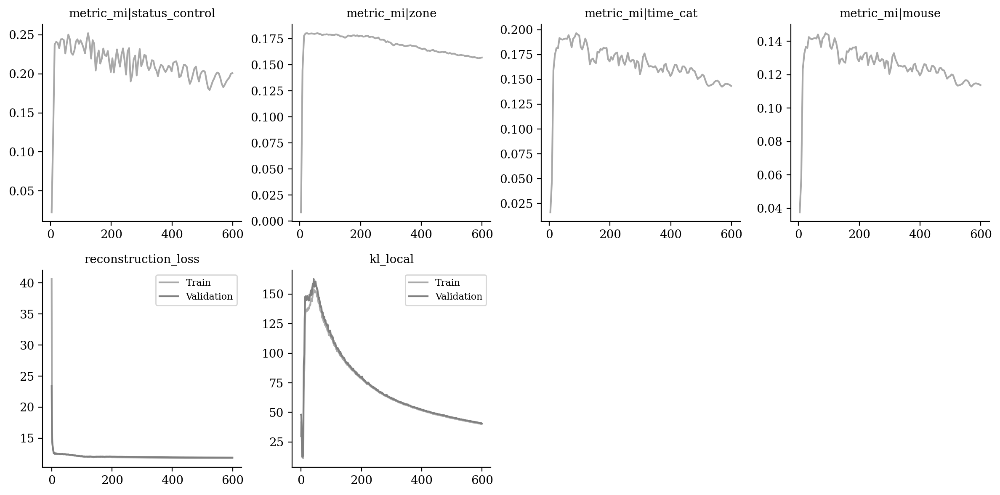

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

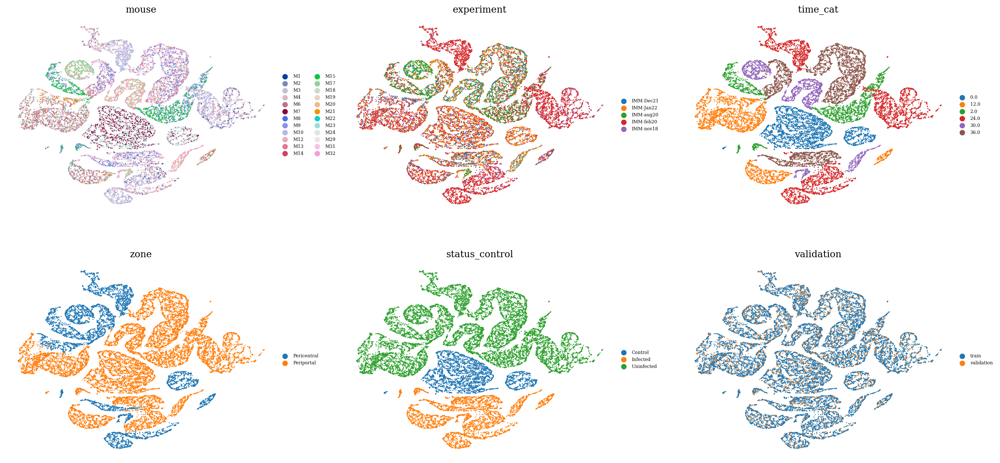

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

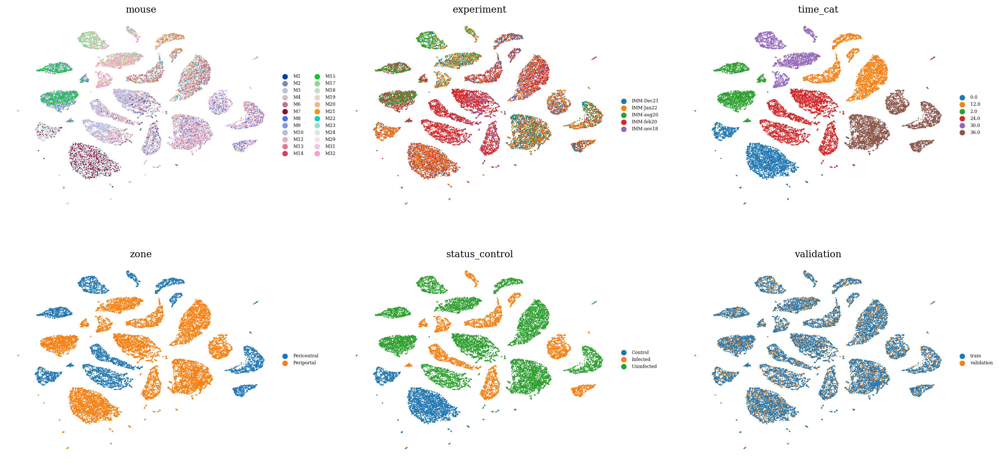

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

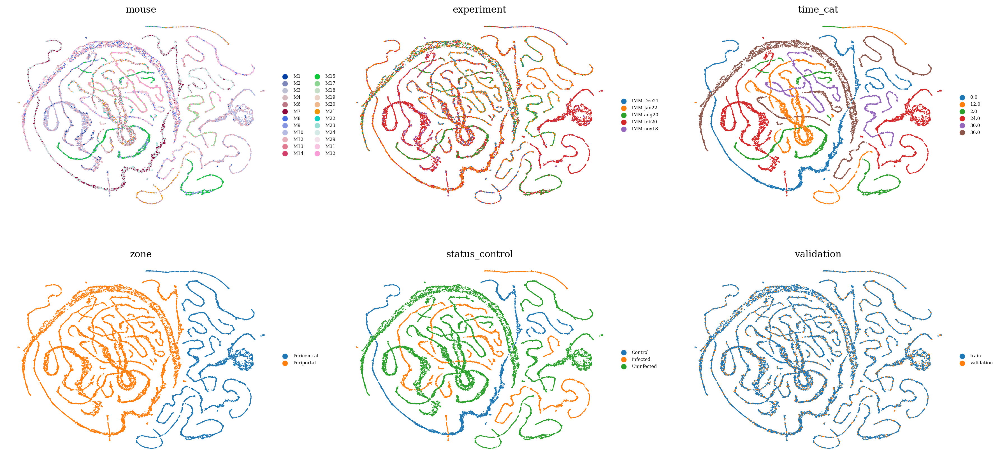

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

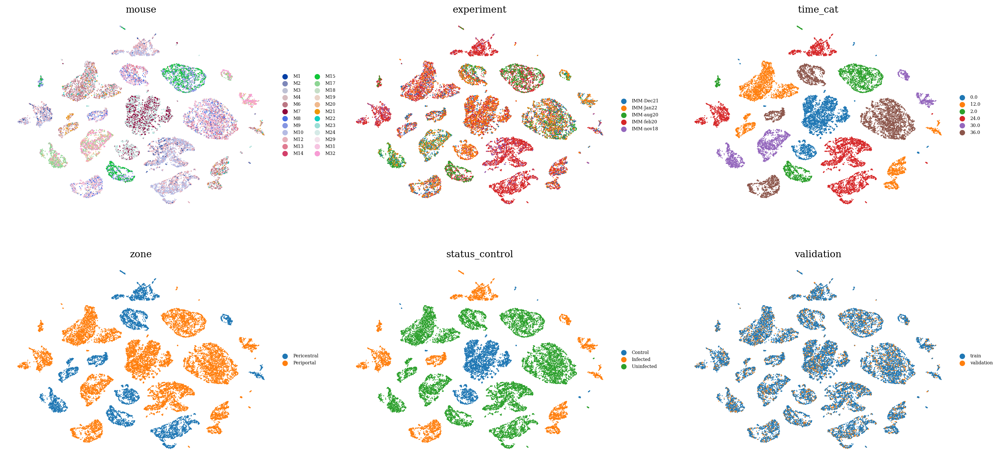

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

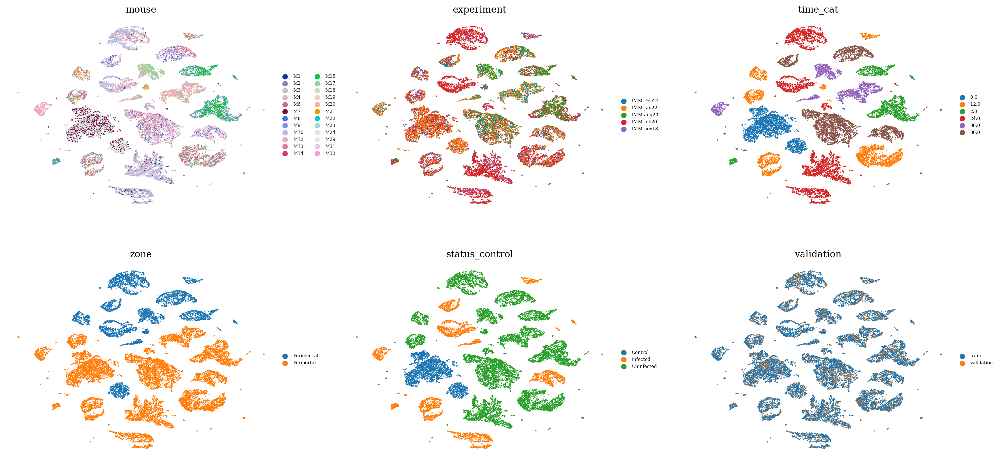

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.527469792951189

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5088036696711994

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9984150322600104,
 ('validation', 'unreserved'): 0.5000526084497512,
 ('train', 'reserved'): 0.9964594840569987,
 ('train', 'unreserved'): 0.46045648602814476}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9953199891190747,
 ('validation', 'unreserved'): 0.6394757579808743,
 ('train', 'reserved'): 0.9967633120772864,
 ('train', 'unreserved'): 0.6113763156007469}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9919821573601714,
 ('validation', 'unreserved'): 0.5780585357524887,
 ('train', 'reserved'): 0.9911045631298213,
 ('train', 'unreserved'): 0.5388340851408959}